In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
from scipy.signal import savgol_filter
from matplotlib import patches as patch
from mpl_toolkits.axes_grid.inset_locator import inset_axes
import math
from skimage.color import rgb2lab, lab2rgb, lab2lch


import tensorflow as tf
%matplotlib inline

import matplotlib.animation as anim
from IPython.display import HTML

from PIL import Image
from matplotlib.patches import Rectangle

import luxpy as lx

from colormath.color_objects import sRGBColor, LabColor
from colormath.color_conversions import convert_color
from colormath.color_diff import delta_e_cie2000

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  


## Dataset Loader

In [2]:
wavelength = np.linspace(400,700, 31)

def objects(path = "C:/Users/renep/Google Drive/Research//Codes/data/complete_ms_data/"):
    object  = os.listdir(path)
    #names.append()
    return object

name = objects()

def dataset_loader(datatype, imagetype):
    #datatype = "datatype"
    def loadImages(path = "C:/Users/renep/Google Drive/Research//Codes/data/complete_ms_data/" +str(datatype)+"/"+ str(datatype)+"/"):

        return[os.path.join(path,f) for f in os.listdir(path) if f.endswith(imagetype)]

    filenames = loadImages()
    images = []
    for file in filenames:
        images.append(plt.imread(file))
        
    return images

def hs_dataset_loader(datatype, imagetype):
    def loadImages(path = "C:/Users/renep/Google Drive/Research//Codes/data/complete_ms_data/" +str(datatype)+"/"+ str(datatype)+"/"):

        return[os.path.join(path,f) for f in os.listdir(path) if f.endswith(imagetype)]

    filenames = loadImages()
    images = np.zeros(shape=(512, 512, 31))
    for file in filenames:
        image = cv2.imread(file)
        images[:,:,filenames.index(file)] =image[:,:,0]

    return images

In [3]:
INPUT = []
INPUT_norm = []
for i in tqdm(name):
    rgb_data = dataset_loader(str(i), ".bmp")
    rgb_data = np.asarray(rgb_data)
    INPUT.append(rgb_data[0])
    INPUT_norm.append(rgb_data[0]/255)
    
#INPUT = INPUT/np.amax(255)

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:06<00:00,  5.04it/s]


In [4]:
OUTPUT = np.zeros(shape=(32, 512, 512, 31))

for i in tqdm(name):
    hs_data = hs_dataset_loader(str(i), ".png")
    hs_data = np.asarray(hs_data)
    OUTPUT[name.index(i),:,:,:] = hs_data[:,:,:]

OUTPUT = OUTPUT/np.amax(OUTPUT)

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [02:02<00:00,  3.84s/it]


In [5]:
np.shape(INPUT)

(32, 512, 512, 3)

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


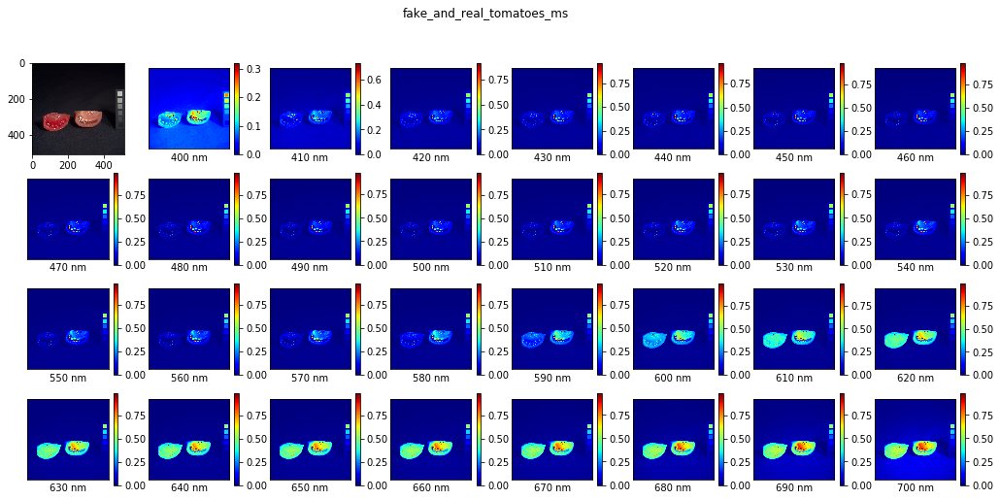

In [8]:
RGB_image = 15
#plt.rcParams['axes.titlesize'] = 20
fig = plt.figure(figsize=[17.5,8])
for i in range(31):
    fig.suptitle(name[RGB_image])
    plt.subplot(4,8,1)
    plt.imshow(INPUT[RGB_image])
    plt.subplot(4,8,i+2)
    plt.imshow(OUTPUT[RGB_image,:,:,i], cmap = "jet")
    plt.xlabel(str(int(wavelength[i])) + ' nm')
    plt.xticks([])
    plt.yticks([])
    plt.colorbar()

In [6]:
def Hyperspectral(RGB,wav1, wav2, wav3):
    fig, axes = plt.subplots(1,4, figsize=(8,3), sharex=True, sharey=True, dpi=200, facecolor = 'w')
    axes[0].imshow(INPUT[RGB], cmap = 'jet')
    axes[0].set_title("RGB Image")
    axes[1].imshow(OUTPUT[RGB,:,:,wavelength.tolist().index(wav1)], cmap = 'jet')
    axes[1].set_title(str(wav1) + " nm")
    axes[2].imshow(OUTPUT[RGB,:,:,wavelength.tolist().index(wav2)], cmap = 'jet')
    axes[2].set_title(str(wav2) + " nm")
    im = axes[3].imshow(OUTPUT[RGB,:,:,wavelength.tolist().index(wav3)], cmap = 'jet')    
    axes[3].set_title(str(wav3) + " nm")

    cax = plt.axes([0.95, 0.2, 0.02,0.6])
    
    fig.colorbar(im, cax=cax, shrink=0.5, label="reflectance")
    plt.show()


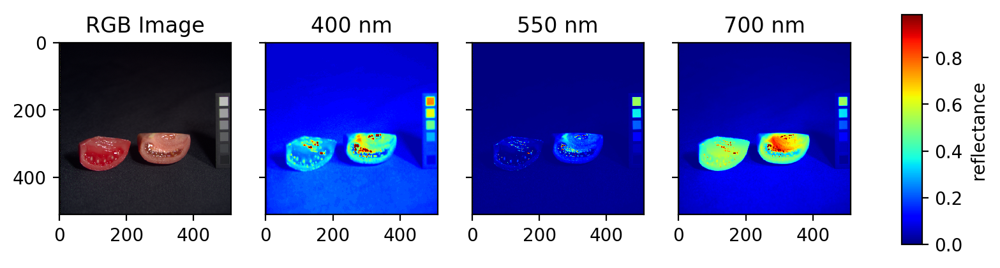

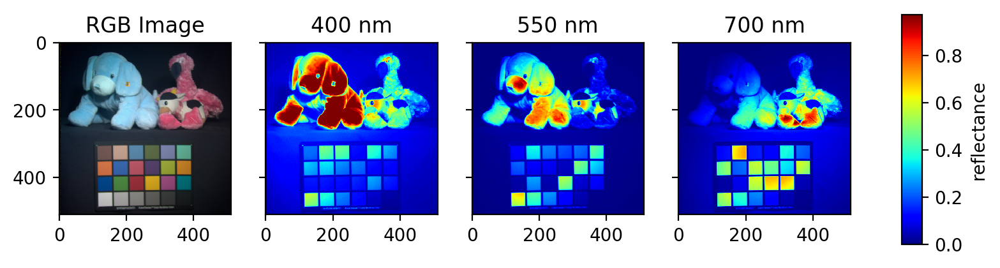

In [8]:
Hyperspectral(15,400, 550, 700)
Hyperspectral(28,400, 550, 700)

In [9]:
"Rendition from predicted HS images"

path = "C:/Users/renep/Google Drive/Research/Dataset"
wavelength = np.arange(400,701,10)

cie = np.loadtxt(path + "/CIE1964.txt")
#x_, y_, z_ = cie[:,0], cie[:,1], cie[:,2], cie[:,3]
x_ = np.interp(wavelength, cie[:,0], cie[:,1])
y_ = np.interp(wavelength, cie[:,0], cie[:,2])
z_ = np.interp(wavelength, cie[:,0], cie[:,3])


'CAVE DATASET Sensitivity'

red = np.loadtxt(path + "/CAVE_RED.txt")
green = np.loadtxt(path + "/CAVE_GREEN.txt")
blue = np.loadtxt(path + "/CAVE_BLUE.txt")

r = savgol_filter(np.interp(wavelength, red[:,0], red[:,1]), 11, 2)
g = savgol_filter(np.interp(wavelength, green[:,0], green[:,1]), 11, 2)
b = savgol_filter(np.interp(wavelength, blue[:,0], blue[:,1]), 11, 2)

'D65 Illuminant'

D65 = lx._CIE_ILLUMINANTS['D65'] 
D65 = np.interp(wavelength, D65[0], D65[1])
D65 = D65/max(D65)

## Defining colorimetric accuracies

In [10]:
def f(t):
    if t > (6/29)**3:
        return t**(1/3)
    else:
        return (((29/6)**2)/3)*t + 4/29
    
def CIELab(spectrum):

    X_n = np.trapz(D65*x_)
    Y_n = np.trapz(D65*y_)
    Z_n = np.trapz(D65*z_)
    
    X = np.trapz(spectrum*D65*x_)
    Y = np.trapz(spectrum*D65*y_)
    Z = np.trapz(spectrum*D65*z_)
        
    L = 116*f(Y/Y_n)-16
    a = 500*(f(X/X_n)-f(Y/Y_n))
    b = 200*(f(Y/Y_n)-f(Z/Z_n))

    return L,a,b

def del_E(LAB_1,LAB_2):
    d_e = np.sqrt((LAB_1[0]-LAB_2[0])**2 + (LAB_1[1]-LAB_2[1])**2 + (LAB_1[2]-LAB_2[2])**2)
    return d_e

def del_E_94(LAB_1,LAB_2):
    
    L1, L2 = LAB_1[0], LAB_2[0]
    a1, a2 = LAB_1[1], LAB_2[1]
    b1, b2 = LAB_1[2], LAB_2[2]
    C1 = np.sqrt(a1**2 + b1**2)
    C2 = np.sqrt(a2**2 + b2**2)
    del_L = L1-L2
    del_C = C1-C2
    del_H = np.sqrt((a1-a2)**2 + (b1-b2)**2 - del_C)
    
    SL = 1
    SC = 1 + 0.045*(np.sqrt(C1*C2))
    SH = 1 + 0.015*(np.sqrt(C1*C2))
    
    d_e = np.sqrt((del_L)**2 + (del_C/SC)**2 + (del_H/SH)**2)
    
    return d_e

In [11]:
def Lum(t):
    if t < (6/29)**3:
        return t*((29/3)**3)
    else:
        return 116*(np.cbrt(t)) - 16
    
def CIELuv(spectrum):

    X_n = np.trapz(D65*x_)
    Y_n = np.trapz(D65*y_)
    Z_n = np.trapz(D65*z_)
    
    X = np.trapz(spectrum*D65*x_)
    Y = np.trapz(spectrum*D65*y_)
    Z = np.trapz(spectrum*D65*z_)
    
    k = 100/Y_n
    X_n, Y_n, Z_n = k*X_n, k*Y_n, k*Z_n
    X, Y, Z = k*X, k*Y, k*Z
    
    u = 4*X/(X+15*Y+3*Z)
    v = 9*Y/(X+15*Y+3*Z)
    
    u_n = 4*X_n/(X_n+15*Y_n+3*Z_n)
    v_n = 9*Y_n/(X_n+15*Y_n+3*Z_n)
    
        
    L = Lum(Y/Y_n)
    u_ = 13*L * (u - u_n)
    v_ = 13*L * (v - v_n)


    return L,u_,v_

In [12]:
def objects(path = "C:/Users/renep/Google Drive/Research/Codes/Latest Models/"):
    object  = os.listdir(path)
    #names.append()
    return object

MODELS = objects()
MODELS = MODELS[4:-2]

MODELS

['MODEL1.model', 'MODEL2.model', 'MODEL3.model', 'MODEL4.model']

## Defining accuracy computer

In [29]:
def Metrics(model):

    RGB2REF = tf.keras.models.load_model(model)
    
    Predicted_Hyperspectral = []
    Predicted_RGB = []
    RMSE = []
    SAM = []
    DE_76 = []
    DE_94 = []
    DE_LUV = []

    print("Prediction using the model")
    for i in tqdm(range(32), desc = "Calculating Accuracies"):

        arr = np.asarray(INPUT[i])
        hs_image_cube = np.zeros(shape=(512, 512, 31))
        
        for j in range(512):
            rgb = arr[:,j]
            predictions = RGB2REF.predict(rgb)
            hs_image_cube[:,j,:] = predictions

        predict_rgb = np.zeros(shape=np.shape(INPUT[i]))
        
        Prediction = hs_image_cube
        Ground_Truth = np.asarray(OUTPUT[i])
#         
        'SPECTRAL ACCURACY'
        rmse = np.zeros(shape=[512,512])
        sam = np.zeros(shape=[512,512])
        
        'COLORIMETRIC ACCURACY'
        dE_76 = np.zeros(shape=[512,512])
        dE_94 = np.zeros(shape=[512,512])
        dE_Luv = np.zeros(shape=[512,512])


        INPUT_norm[i] = INPUT_norm[i]/np.amax(INPUT_norm[i])

        print("Computing for image " + str(i))

        for x in range(512):
            for y in range(512):

                
                pred = Prediction[x,y]
                act = Ground_Truth[x,y]
                
                
                rmse[x,y] = (np.sqrt(sum((act-pred)**2)/len(pred)))
                sam[x,y] = (np.arccos(sum(pred*act)/(np.sqrt(sum(pred**2))*(np.sqrt(sum(act**2))))))

                spectrum = hs_image_cube[x,y]
                
                R = np.trapz(spectrum*r*D65)
                G = np.trapz(spectrum*g*D65)
                B = np.trapz(spectrum*b*D65)
                

                dE_76[x,y] = del_E(CIELab(OUTPUT[i,x,y]),CIELab(spectrum))
                dE_94[x,y] = del_E_94(CIELab(OUTPUT[i,x,y]),CIELab(spectrum))
                dE_Luv[x,y] = del_E(CIELuv(OUTPUT[i,x,y]),CIELuv(spectrum))

                predict_rgb[x,y,:] = R,G,B
                
        predict_rgb = predict_rgb/np.amax(predict_rgb)
        
        Predicted_Hyperspectral.append(hs_image_cube)
        Predicted_RGB.append(predict_rgb)
        
        RMSE.append(rmse)
        SAM.append(sam)
        DE_76.append(dE_76)
        DE_94.append(dE_ch_ab)
        DE_LUV.append(dE_ch_uv)


    return Predicted_Hyperspectral, Predicted_RGB, RMSE, SAM, DE_76, DE_94,  DE_LUV


In [30]:
results_path = "C:/Users/renep/Google Drive/Research/THESIS RESULTS/CAVE Results/"

In [31]:
MODELS

['MODEL1.model', 'MODEL2.model', 'MODEL3.model', 'MODEL4.model']

# Calculating Prediction Accuracy

In [32]:

for model in tqdm(MODELS, desc = "MODEL"):
    number = MODELS.index(model)+1
    print("Working on " + str(model))
    Predicted_Hyperspectral, Predicted_RGB, RMSE, SAM, DE_76,  DE_94,  DE_LUV = Metrics(model)
    np.save(results_path + "HS_model_" + str(number), Predicted_Hyperspectral)
    np.save(results_path + "RGB_model_"+ str(number), Predicted_RGB)
    np.save(results_path + "RMSE_model_"+ str(number), RMSE)
    np.save(results_path + "SAM_model_"+ str(number), SAM)
    np.save(results_path + "DE_76_model_"+ str(number), DE_76)
    np.save(results_path + "DE_94_model_"+ str(number), DE_94)
    np.save(results_path + "DE_LUV_model_"+ str(number), DE_LUV)


MODEL:   0%|                                                                                     | 0/4 [00:00<?, ?it/s]

Working on MODEL1.model
Prediction using the model



Calculating Accuracies:   0%|                                                                   | 0/32 [00:00<?, ?it/s]

Computing for image 0


C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in sqrt

Calculating Accuracies:   3%|█▊                                                         | 1/32 [01:37<50:12, 97.17s/it]

Computing for image 1



Calculating Accuracies:   6%|███▋                                                       | 2/32 [03:17<49:07, 98.25s/it]

Computing for image 2



Calculating Accuracies:   9%|█████▌                                                     | 3/32 [04:57<47:41, 98.66s/it]

Computing for image 3



Calculating Accuracies:  12%|███████▍                                                   | 4/32 [06:36<46:07, 98.84s/it]

Computing for image 4



Calculating Accuracies:  16%|█████████                                                 | 5/32 [08:20<45:06, 100.23s/it]

Computing for image 5



Calculating Accuracies:  19%|██████████▉                                               | 6/32 [10:00<43:24, 100.16s/it]

Computing for image 6



Calculating Accuracies:  22%|████████████▉                                              | 7/32 [11:36<41:15, 99.02s/it]

Computing for image 7



Calculating Accuracies:  25%|██████████████▊                                            | 8/32 [13:11<39:06, 97.77s/it]

Computing for image 8



Calculating Accuracies:  28%|████████████████▌                                          | 9/32 [14:49<37:29, 97.79s/it]

Computing for image 9



Calculating Accuracies:  31%|██████████████████▏                                       | 10/32 [16:27<35:54, 97.95s/it]

Computing for image 10



Calculating Accuracies:  34%|███████████████████▉                                      | 11/32 [18:05<34:16, 97.93s/it]

Computing for image 11



Calculating Accuracies:  38%|█████████████████████▊                                    | 12/32 [19:43<32:37, 97.85s/it]

Computing for image 12



Calculating Accuracies:  41%|███████████████████████▌                                  | 13/32 [21:19<30:51, 97.45s/it]

Computing for image 13



Calculating Accuracies:  44%|█████████████████████████▍                                | 14/32 [22:55<29:07, 97.07s/it]

Computing for image 14



Calculating Accuracies:  47%|███████████████████████████▏                              | 15/32 [24:32<27:27, 96.89s/it]

Computing for image 15



Calculating Accuracies:  50%|█████████████████████████████                             | 16/32 [26:10<25:54, 97.13s/it]

Computing for image 16



Calculating Accuracies:  53%|██████████████████████████████▊                           | 17/32 [27:48<24:23, 97.54s/it]

Computing for image 17



Calculating Accuracies:  56%|████████████████████████████████▋                         | 18/32 [29:25<22:43, 97.42s/it]

Computing for image 18



Calculating Accuracies:  59%|██████████████████████████████████▍                       | 19/32 [31:07<21:24, 98.84s/it]

Computing for image 19



Calculating Accuracies:  62%|████████████████████████████████████▎                     | 20/32 [32:46<19:44, 98.68s/it]

Computing for image 20



Calculating Accuracies:  66%|██████████████████████████████████████                    | 21/32 [34:27<18:14, 99.53s/it]

Computing for image 21



Calculating Accuracies:  69%|███████████████████████████████████████▏                 | 22/32 [36:10<16:44, 100.47s/it]

Computing for image 22



Calculating Accuracies:  72%|████████████████████████████████████████▉                | 23/32 [37:53<15:12, 101.34s/it]

Computing for image 23



Calculating Accuracies:  75%|██████████████████████████████████████████▊              | 24/32 [39:34<13:28, 101.09s/it]

Computing for image 24



Calculating Accuracies:  78%|████████████████████████████████████████████▌            | 25/32 [41:14<11:45, 100.85s/it]

Computing for image 25



Calculating Accuracies:  81%|███████████████████████████████████████████████▏          | 26/32 [42:50<09:56, 99.46s/it]

Computing for image 26



Calculating Accuracies:  84%|████████████████████████████████████████████████▉         | 27/32 [44:29<08:16, 99.28s/it]

Computing for image 27



Calculating Accuracies:  88%|██████████████████████████████████████████████████▊       | 28/32 [46:05<06:33, 98.34s/it]

Computing for image 28



Calculating Accuracies:  91%|████████████████████████████████████████████████████▌     | 29/32 [47:44<04:55, 98.60s/it]

Computing for image 29



Calculating Accuracies:  94%|█████████████████████████████████████████████████████▍   | 30/32 [49:28<03:20, 100.22s/it]

Computing for image 30



Calculating Accuracies:  97%|███████████████████████████████████████████████████████▏ | 31/32 [51:11<01:40, 100.79s/it]

Computing for image 31



MODEL:  25%|██████████████████▎                                                      | 1/4 [53:29<2:40:29, 3209.67s/it]

Working on MODEL2.model
Prediction using the model



Calculating Accuracies:   0%|                                                                   | 0/32 [00:00<?, ?it/s]

Computing for image 0



Calculating Accuracies:   3%|█▊                                                        | 1/32 [01:43<53:13, 103.01s/it]

Computing for image 1



Calculating Accuracies:   6%|███▋                                                      | 2/32 [03:30<52:06, 104.21s/it]

Computing for image 2



Calculating Accuracies:   9%|█████▍                                                    | 3/32 [05:15<50:30, 104.49s/it]

Computing for image 3



Calculating Accuracies:  12%|███████▎                                                  | 4/32 [06:54<47:58, 102.81s/it]

Computing for image 4



Calculating Accuracies:  16%|█████████                                                 | 5/32 [08:33<45:52, 101.94s/it]

Computing for image 5



Calculating Accuracies:  19%|██████████▉                                               | 6/32 [10:14<44:03, 101.66s/it]

Computing for image 6



Calculating Accuracies:  22%|████████████▋                                             | 7/32 [11:57<42:27, 101.90s/it]

Computing for image 7



Calculating Accuracies:  25%|██████████████▌                                           | 8/32 [13:33<40:06, 100.28s/it]

Computing for image 8



Calculating Accuracies:  28%|████████████████▎                                         | 9/32 [15:14<38:30, 100.44s/it]

Computing for image 9



Calculating Accuracies:  31%|█████████████████▊                                       | 10/32 [16:55<36:52, 100.59s/it]

Computing for image 10



Calculating Accuracies:  34%|███████████████████▌                                     | 11/32 [18:37<35:22, 101.07s/it]

Computing for image 11



Calculating Accuracies:  38%|█████████████████████▍                                   | 12/32 [20:22<34:04, 102.20s/it]

Computing for image 12



Calculating Accuracies:  41%|███████████████████████▏                                 | 13/32 [22:05<32:24, 102.36s/it]

Computing for image 13



Calculating Accuracies:  44%|████████████████████████▉                                | 14/32 [23:48<30:48, 102.70s/it]

Computing for image 14



Calculating Accuracies:  47%|██████████████████████████▋                              | 15/32 [25:30<29:02, 102.47s/it]

Computing for image 15



Calculating Accuracies:  50%|████████████████████████████▌                            | 16/32 [27:18<27:46, 104.14s/it]

Computing for image 16



Calculating Accuracies:  53%|██████████████████████████████▎                          | 17/32 [29:03<26:02, 104.15s/it]

Computing for image 17



Calculating Accuracies:  56%|████████████████████████████████                         | 18/32 [30:47<24:19, 104.24s/it]

Computing for image 18



Calculating Accuracies:  59%|█████████████████████████████████▊                       | 19/32 [32:34<22:46, 105.15s/it]

Computing for image 19



Calculating Accuracies:  62%|███████████████████████████████████▋                     | 20/32 [34:19<20:59, 104.99s/it]

Computing for image 20



Calculating Accuracies:  66%|█████████████████████████████████████▍                   | 21/32 [36:05<19:18, 105.30s/it]

Computing for image 21



Calculating Accuracies:  69%|███████████████████████████████████████▏                 | 22/32 [37:48<17:25, 104.53s/it]

Computing for image 22



Calculating Accuracies:  72%|████████████████████████████████████████▉                | 23/32 [39:33<15:42, 104.68s/it]

Computing for image 23



Calculating Accuracies:  75%|██████████████████████████████████████████▊              | 24/32 [41:09<13:38, 102.28s/it]

Computing for image 24



Calculating Accuracies:  78%|████████████████████████████████████████████▌            | 25/32 [42:47<11:46, 100.93s/it]

Computing for image 25



Calculating Accuracies:  81%|██████████████████████████████████████████████▎          | 26/32 [44:29<10:06, 101.06s/it]

Computing for image 26



Calculating Accuracies:  84%|████████████████████████████████████████████████         | 27/32 [46:11<08:27, 101.59s/it]

Computing for image 27



Calculating Accuracies:  88%|█████████████████████████████████████████████████▉       | 28/32 [47:53<06:46, 101.64s/it]

Computing for image 28



Calculating Accuracies:  91%|███████████████████████████████████████████████████▋     | 29/32 [49:38<05:07, 102.60s/it]

Computing for image 29



Calculating Accuracies:  94%|█████████████████████████████████████████████████████▍   | 30/32 [51:23<03:26, 103.39s/it]

Computing for image 30



Calculating Accuracies:  97%|███████████████████████████████████████████████████████▏ | 31/32 [53:07<01:43, 103.58s/it]

Computing for image 31



MODEL:  50%|███████████████████████████████████▌                                   | 2/4 [1:49:04<1:48:14, 3247.35s/it]

Working on MODEL3.model
Prediction using the model



Calculating Accuracies:   0%|                                                                   | 0/32 [00:00<?, ?it/s]

Computing for image 0



Calculating Accuracies:   3%|█▊                                                        | 1/32 [01:44<53:47, 104.10s/it]

Computing for image 1



Calculating Accuracies:   6%|███▋                                                      | 2/32 [03:31<52:34, 105.14s/it]

Computing for image 2



Calculating Accuracies:   9%|█████▍                                                    | 3/32 [05:12<50:13, 103.90s/it]

Computing for image 3



Calculating Accuracies:  12%|███████▎                                                  | 4/32 [06:55<48:16, 103.44s/it]

Computing for image 4



Calculating Accuracies:  16%|█████████                                                 | 5/32 [08:44<47:25, 105.39s/it]

Computing for image 5



Calculating Accuracies:  19%|██████████▉                                               | 6/32 [10:29<45:36, 105.27s/it]

Computing for image 6



Calculating Accuracies:  22%|████████████▋                                             | 7/32 [12:13<43:41, 104.84s/it]

Computing for image 7



Calculating Accuracies:  25%|██████████████▌                                           | 8/32 [13:59<41:59, 104.97s/it]

Computing for image 8



Calculating Accuracies:  28%|████████████████▎                                         | 9/32 [15:38<39:33, 103.19s/it]

Computing for image 9



Calculating Accuracies:  31%|█████████████████▊                                       | 10/32 [17:16<37:20, 101.86s/it]

Computing for image 10



Calculating Accuracies:  34%|███████████████████▌                                     | 11/32 [18:56<35:22, 101.08s/it]

Computing for image 11



Calculating Accuracies:  38%|█████████████████████▍                                   | 12/32 [20:35<33:30, 100.51s/it]

Computing for image 12



Calculating Accuracies:  41%|███████████████████████▏                                 | 13/32 [22:19<32:10, 101.61s/it]

Computing for image 13



Calculating Accuracies:  44%|████████████████████████▉                                | 14/32 [23:58<30:12, 100.69s/it]

Computing for image 14



Calculating Accuracies:  47%|██████████████████████████▋                              | 15/32 [25:38<28:31, 100.67s/it]

Computing for image 15



Calculating Accuracies:  50%|█████████████████████████████                             | 16/32 [27:15<26:32, 99.55s/it]

Computing for image 16



Calculating Accuracies:  53%|██████████████████████████████▊                           | 17/32 [28:54<24:48, 99.22s/it]

Computing for image 17



Calculating Accuracies:  56%|████████████████████████████████▋                         | 18/32 [30:32<23:05, 98.94s/it]

Computing for image 18



Calculating Accuracies:  59%|██████████████████████████████████▍                       | 19/32 [32:12<21:30, 99.25s/it]

Computing for image 19



Calculating Accuracies:  62%|████████████████████████████████████▎                     | 20/32 [33:51<19:51, 99.31s/it]

Computing for image 20



Calculating Accuracies:  66%|█████████████████████████████████████▍                   | 21/32 [35:34<18:23, 100.34s/it]

Computing for image 21



Calculating Accuracies:  69%|███████████████████████████████████████▉                  | 22/32 [37:12<16:36, 99.67s/it]

Computing for image 22



Calculating Accuracies:  72%|█████████████████████████████████████████▋                | 23/32 [38:50<14:53, 99.23s/it]

Computing for image 23



Calculating Accuracies:  75%|███████████████████████████████████████████▌              | 24/32 [40:30<13:13, 99.23s/it]

Computing for image 24



Calculating Accuracies:  78%|█████████████████████████████████████████████▎            | 25/32 [42:10<11:36, 99.55s/it]

Computing for image 25



Calculating Accuracies:  81%|███████████████████████████████████████████████▏          | 26/32 [43:45<09:49, 98.28s/it]

Computing for image 26



Calculating Accuracies:  84%|████████████████████████████████████████████████▉         | 27/32 [45:19<08:04, 96.87s/it]

Computing for image 27



Calculating Accuracies:  88%|██████████████████████████████████████████████████▊       | 28/32 [46:52<06:23, 95.90s/it]

Computing for image 28



Calculating Accuracies:  91%|████████████████████████████████████████████████████▌     | 29/32 [48:27<04:46, 95.48s/it]

Computing for image 29



Calculating Accuracies:  94%|██████████████████████████████████████████████████████▍   | 30/32 [50:07<03:13, 96.98s/it]

Computing for image 30



Calculating Accuracies:  97%|████████████████████████████████████████████████████████▏ | 31/32 [51:44<01:37, 97.02s/it]

Computing for image 31



MODEL:  75%|██████████████████████████████████████████████████████▊                  | 3/4 [2:43:10<54:06, 3246.76s/it]

Working on MODEL4.model
Prediction using the model



Calculating Accuracies:   0%|                                                                   | 0/32 [00:00<?, ?it/s]

Computing for image 0



Calculating Accuracies:   3%|█▊                                                        | 1/32 [01:47<55:32, 107.52s/it]

Computing for image 1



Calculating Accuracies:   6%|███▋                                                      | 2/32 [03:35<53:45, 107.52s/it]

Computing for image 2



Calculating Accuracies:   9%|█████▍                                                    | 3/32 [05:20<51:41, 106.95s/it]

Computing for image 3



Calculating Accuracies:  12%|███████▎                                                  | 4/32 [07:06<49:47, 106.70s/it]

Computing for image 4



Calculating Accuracies:  16%|█████████                                                 | 5/32 [08:52<47:49, 106.28s/it]

Computing for image 5



Calculating Accuracies:  19%|██████████▉                                               | 6/32 [10:37<45:57, 106.06s/it]

Computing for image 6



Calculating Accuracies:  22%|████████████▋                                             | 7/32 [12:22<44:02, 105.71s/it]

Computing for image 7



Calculating Accuracies:  25%|██████████████▌                                           | 8/32 [14:06<42:04, 105.18s/it]

Computing for image 8



Calculating Accuracies:  28%|████████████████▎                                         | 9/32 [15:51<40:15, 105.04s/it]

Computing for image 9



Calculating Accuracies:  31%|█████████████████▊                                       | 10/32 [17:30<37:55, 103.43s/it]

Computing for image 10



Calculating Accuracies:  34%|███████████████████▌                                     | 11/32 [19:10<35:49, 102.36s/it]

Computing for image 11



Calculating Accuracies:  38%|█████████████████████▍                                   | 12/32 [20:50<33:51, 101.57s/it]

Computing for image 12



Calculating Accuracies:  41%|███████████████████████▏                                 | 13/32 [22:31<32:06, 101.37s/it]

Computing for image 13



Calculating Accuracies:  44%|████████████████████████▉                                | 14/32 [24:11<30:18, 101.05s/it]

Computing for image 14



Calculating Accuracies:  47%|██████████████████████████▋                              | 15/32 [25:52<28:36, 100.96s/it]

Computing for image 15



Calculating Accuracies:  50%|████████████████████████████▌                            | 16/32 [27:32<26:53, 100.81s/it]

Computing for image 16



Calculating Accuracies:  53%|██████████████████████████████▎                          | 17/32 [29:11<25:04, 100.29s/it]

Computing for image 17



Calculating Accuracies:  56%|████████████████████████████████                         | 18/32 [30:51<23:21, 100.08s/it]

Computing for image 18



Calculating Accuracies:  59%|██████████████████████████████████▍                       | 19/32 [32:30<21:38, 99.88s/it]

Computing for image 19



Calculating Accuracies:  62%|████████████████████████████████████▎                     | 20/32 [34:10<19:56, 99.74s/it]

Computing for image 20



Calculating Accuracies:  66%|██████████████████████████████████████                    | 21/32 [35:49<18:15, 99.62s/it]

Computing for image 21



Calculating Accuracies:  69%|███████████████████████████████████████▉                  | 22/32 [37:29<16:37, 99.75s/it]

Computing for image 22



Calculating Accuracies:  72%|█████████████████████████████████████████▋                | 23/32 [39:08<14:55, 99.55s/it]

Computing for image 23



Calculating Accuracies:  75%|███████████████████████████████████████████▌              | 24/32 [40:47<13:14, 99.27s/it]

Computing for image 24



Calculating Accuracies:  78%|█████████████████████████████████████████████▎            | 25/32 [42:27<11:36, 99.47s/it]

Computing for image 25



Calculating Accuracies:  81%|███████████████████████████████████████████████▏          | 26/32 [44:06<09:55, 99.27s/it]

Computing for image 26



Calculating Accuracies:  84%|████████████████████████████████████████████████▉         | 27/32 [45:46<08:17, 99.51s/it]

Computing for image 27



Calculating Accuracies:  88%|██████████████████████████████████████████████████▊       | 28/32 [47:25<06:38, 99.55s/it]

Computing for image 28



Calculating Accuracies:  91%|████████████████████████████████████████████████████▌     | 29/32 [49:04<04:58, 99.38s/it]

Computing for image 29



Calculating Accuracies:  94%|██████████████████████████████████████████████████████▍   | 30/32 [50:44<03:18, 99.36s/it]

Computing for image 30



Calculating Accuracies:  97%|████████████████████████████████████████████████████████▏ | 31/32 [52:24<01:39, 99.56s/it]

Computing for image 31



MODEL: 100%|█████████████████████████████████████████████████████████████████████████| 4/4 [3:37:38<00:00, 3253.22s/it]


# Reloading of Results

In [10]:
results_path = "C:/Users/renep/Google Drive/Research/THESIS RESULTS/CAVE Results/"

In [13]:
RGB_overall = []
#HS_overall = []
RMSE_overall = []
SAM_overall = []
DE_76_overall = []
DE_94_overall = []
DE_LUV_overall = []

#results_path = "C:/Users/renep/Google Drive/Research/RMs/RM8/"

for i in tqdm(range(4)):
    #print("Working on Hyperspectral Reconstruction")
    #HS = np.load(results_path + "HS_model_" + str(i+1) + ".npy")
    #HS_overall.append(HS)

    print("Working on RGB Reconstruction")
    RGB = np.load(results_path + "RGB_model_" + str(i+1) + ".npy")
    RGB_overall.append(RGB)
    
    print("Working on RMSE")
    RMSE = np.load(results_path + "RMSE_model_" + str(i+1) + ".npy")
    RMSE_overall.append(np.nan_to_num(RMSE).flatten())
    print("Working on SAM")
    SAM = np.load(results_path + "SAM_model_" + str(i+1) + ".npy")
    SAM_overall.append(np.nan_to_num(SAM).flatten())
    print("Working on DE 76")
    DE_76 = np.load(results_path + "DE_76_model_" + str(i+1) + ".npy")
    DE_76_overall.append(np.nan_to_num(DE_76).flatten())
    print("Working on DE 94")
    DE_94 = np.load(results_path + "DE_94_model_" + str(i+1) + ".npy")
    DE_94_overall.append(np.nan_to_num(DE_94).flatten())
    print("Working on DE LUV")
    DE_LUV = np.load(results_path + "DE_LUV_model_" + str(i+1) + ".npy")
    DE_LUV_overall.append(np.nan_to_num(DE_LUV).flatten())
    
  

# SAM_overall = np.nan_to_num(SAM_overall)
# DE_CH_AB_overall = np.nan_to_num(DE_CH_AB_overall)



  0%|                                                                                            | 0/4 [00:00<?, ?it/s]

Working on RGB Reconstruction
Working on RMSE
Working on SAM
Working on DE 76
Working on DE 94
Working on DE LUV



 25%|█████████████████████                                                               | 1/4 [00:03<00:09,  3.31s/it]

Working on RGB Reconstruction
Working on RMSE
Working on SAM
Working on DE 76
Working on DE 94
Working on DE LUV



 50%|██████████████████████████████████████████                                          | 2/4 [00:15<00:11,  6.00s/it]

Working on RGB Reconstruction
Working on RMSE
Working on SAM
Working on DE 76
Working on DE 94
Working on DE LUV



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:40<00:11, 11.67s/it]

Working on RGB Reconstruction
Working on RMSE
Working on SAM
Working on DE 76
Working on DE 94
Working on DE LUV



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:06<00:00, 16.52s/it]


In [130]:
# for i in range(4):
#     print("Model " + str(i+1))
#     print("RMSE")
#     print(np.mean(RMSE_overall[i]))
#     print("SAM")
#     print(np.mean(SAM_overall[i]))
#     print("DE LUV")
#     print(np.mean(DE_CH_UV_overall[i]))

In [131]:
# i = 1
# print("Model " + str(i+1))
# print("RMSE")
# print(np.std(RMSE_overall[i]))
# print("SAM")
# print(np.std(SAM_overall[i]))
# print("DE LUV")
# print(np.std(DE_CH_UV_overall[i]))

## Error histogram distribution

### RMSE

In [14]:
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 12})

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken

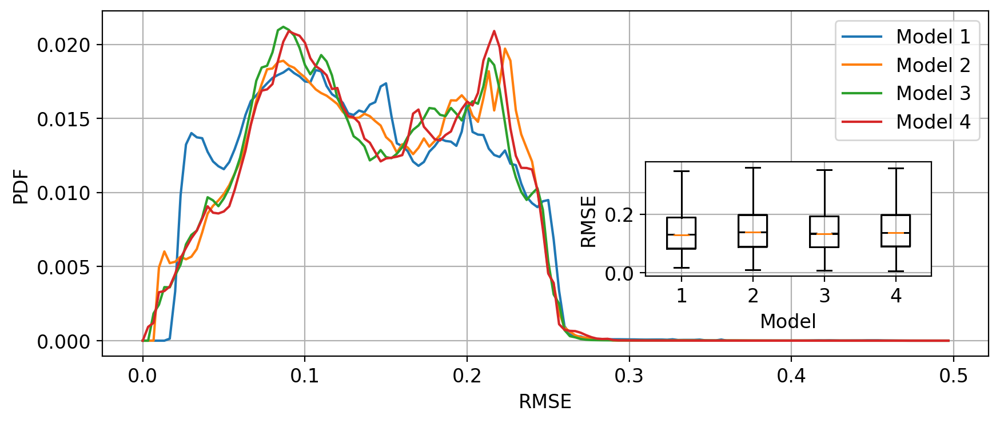

In [18]:
from mpl_toolkits.axes_grid.inset_locator import inset_axes


"RMSE"

fig, ax1 = plt.subplots(figsize = (10,4),dpi = 200, facecolor = 'w')
left, bottom, width, height = [0.6, 0.3, 0.25, 0.25]
ax2 = fig.add_axes([left, bottom, width, height])

for i in range(4):

    mean = np.mean(RMSE_overall[i])
    std = np.std(RMSE_overall[i])
    hist, bins = np.histogram(RMSE_overall[i], bins = 150, range = [0,0.5], normed = "True")    
    #ax1.bar(bins[:-1], hist/sum(hist), width=0.002, alpha = 0.7, label = "Model " + str(i+1))
    ax1.plot(bins[:-1], hist/sum(hist), lw = 1.5, alpha = 1, label = "Model " + str(i+1))
    ax1.legend()

    ax1.set_xlabel("RMSE")
    ax1.set_ylabel("PDF")
    ax1.grid('True')
    
    ax2.boxplot(RMSE_overall, notch = True, widths = 0.4, showfliers = False)
    ax2.set_xticks(np.arange(4)+1)
    ax2.set_ylabel("RMSE")
    ax2.set_xlabel("Model")
    ax2.grid('True')

plt.savefig(results_path + "PDF_RMSE_bar.png")
plt.show()

### SAM

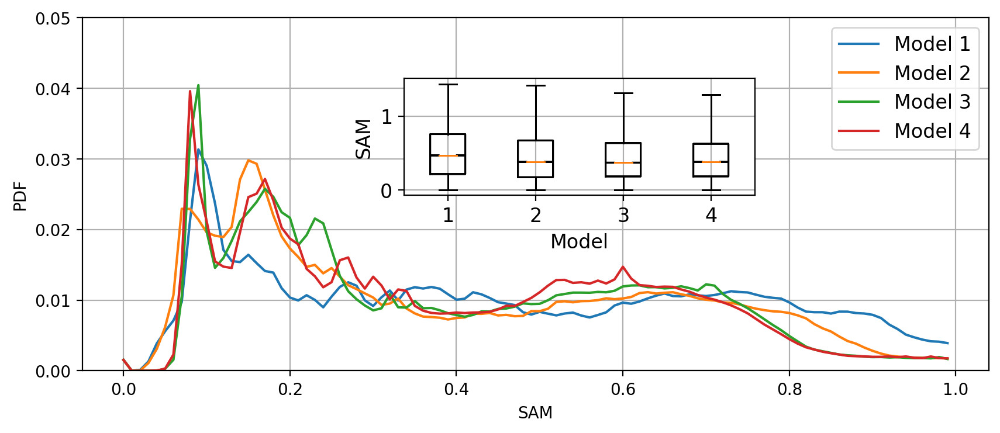

In [19]:
"SAM"
%matplotlib inline
fig, ax1 = plt.subplots(figsize = (10,4),dpi = 200,facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 12})
left, bottom, width, height = [0.40,0.5, 0.3, 0.25]
ax2 = fig.add_axes([left, bottom, width, height])

for i in range(4):

    hist, bins = np.histogram(SAM_overall[i], bins = 100, range = [0,1])
    #ax1.bar(bins[:-1], hist/sum(hist), width=0.005, alpha = 0.9, label = str(epochs[i]) + " epochs")
    ax1.plot(bins[:-1], hist/sum(hist), lw = 1.5, alpha = 1, label = "Model " + str(i+1))

    ax1.legend()
    
    ax1.set_xlabel("SAM")
    ax1.set_ylabel("PDF")
    ax1.set_ylim(0,0.05)
    ax1.grid('True')
    
    ax2.boxplot(SAM_overall, notch = True, widths = 0.4, showfliers = False)
    ax2.set_xticks(np.arange(4)+1)
    
    ax2.set_ylabel("SAM")
    ax2.set_xlabel("Model")
    ax2.grid('True')

    
plt.savefig(results_path + "PDF_SAM.png")
plt.show()

### $\Delta$E (1976)

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  # Remove the CWD from sys.path while we load stuff.


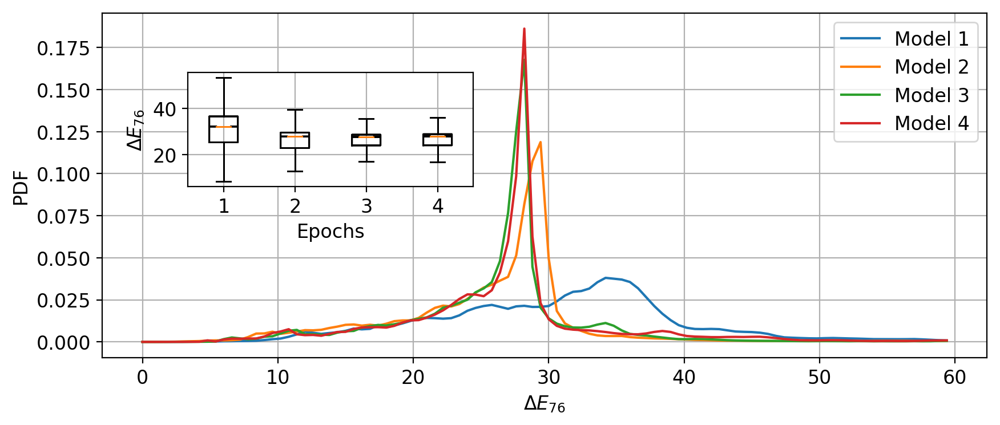

In [25]:
"delta E (1976)"

fig, ax1 = plt.subplots(figsize = (10,4),dpi = 200, facecolor = 'w')
left, bottom, width, height = [0.2, 0.5, 0.25, 0.25]
ax2 = fig.add_axes([left, bottom, width, height])
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 12})
for i in range(4):

    hist, bins = np.histogram(DE_76_overall[i], bins = 100, range = [0,60], normed = "True")
    #ax1.bar(bins[:-1], hist/sum(hist), width=0.3, alpha = 0.9, label = str(epochs[i]) + "e pochs")
    ax1.plot(bins[:-1], hist/sum(hist), lw = 1.5, alpha = 1, label = "Model " + str(i+1))

    ax1.legend()

    ax1.set_xlabel("$\Delta E_{76}$")
    ax1.set_ylabel("PDF")
    ax1.grid('True')

    ax2.boxplot(DE_76_overall, notch = True, widths = 0.4, showfliers = False)
    ax2.set_xticks(np.arange(len(MODELS))+1)
    
    ax2.set_ylabel("$\Delta E_{76}$")
    ax2.set_xlabel("Epochs")
    ax2.grid('True')


plt.savefig(results_path + "PDF_DE76.png")
plt.show()

### $\Delta$E (CH$_{ab}$)

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  # Remove the CWD from sys.path while we load stuff.
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  # Remove the CWD from sys.path while we load stuff.
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launc

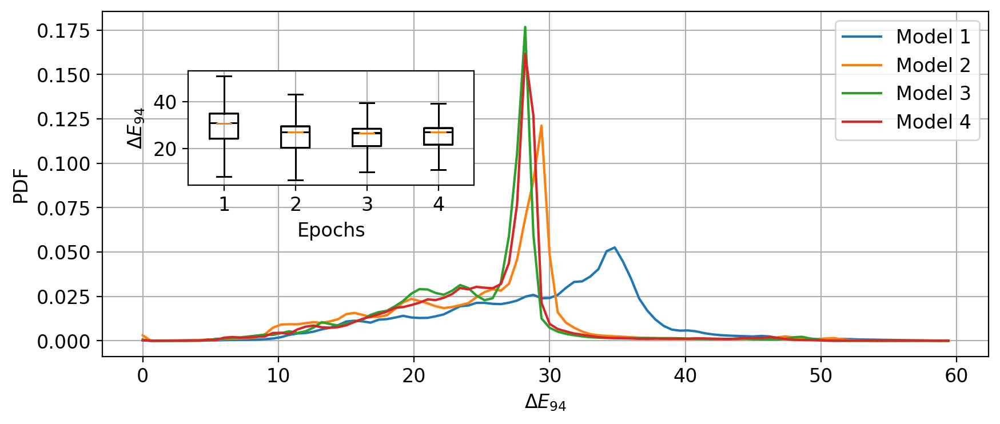

In [20]:
"delta E (CH AB)"

fig, ax1 = plt.subplots(figsize = (10,4),dpi = 200, facecolor = 'w')
left, bottom, width, height = [0.2, 0.5, 0.25, 0.25]
ax2 = fig.add_axes([left, bottom, width, height])


for i in range(4):
        
    hist, bins = np.histogram(DE_94_overall[i], bins = 100, range = [0,60], normed = "True")
    #ax1.bar(bins[:-1], hist/sum(hist), width=0.3, alpha = 0.9, label = str(epochs[i]) + " epochs")
    ax1.plot(bins[:-1], hist/sum(hist), lw = 1.5, alpha = 1, label = "Model " + str(i+1))
    ax1.legend()
    ax1.set_xlabel("$\Delta E_{94}$")
    ax1.set_ylabel("PDF")
    ax1.grid('True')

    
    ax2.boxplot(DE_94_overall, notch = True, widths = 0.4, showfliers = False)
    ax2.set_xticks(np.arange(4)+1)

    ax2.set_ylabel("$\Delta E_{94}$")
    ax2.set_xlabel("Epochs")
    ax2.grid('True')

fig.savefig(results_path + "PDF_CH_AB.png")
plt.show()

### $\Delta$E (CH$_{uv}$)

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  del sys.path[0]
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  del sys.path[0]
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: VisibleDeprecationWarning: Passing `normed=True` on non-unifo

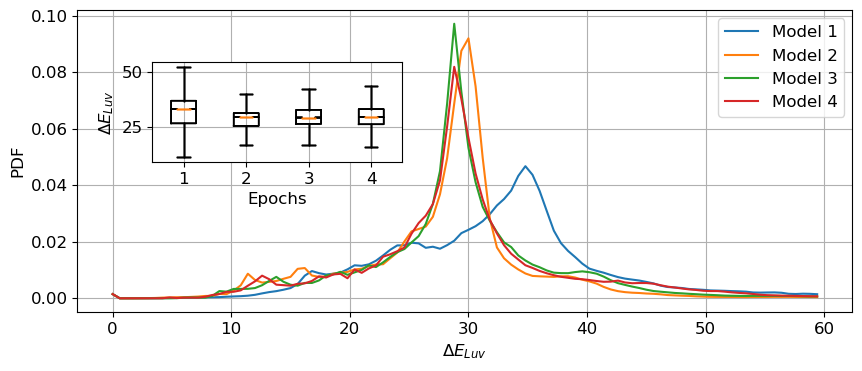

In [21]:
"delta E (CH UV)"

fig, ax1 = plt.subplots(figsize = (10,4),dpi = 100)
left, bottom, width, height = [0.2, 0.5, 0.25, 0.25]
ax2 = fig.add_axes([left, bottom, width, height])
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 12})


for i in range(4):

    
    hist, bins = np.histogram(DE_LUV_overall[i], bins = 100, range = [0,60], normed = "True")
    #ax1.bar(bins[:-1], hist/sum(hist), width=0.3, alpha = 0.9, label = str(epochs[i]) + " epochs")
    ax1.plot(bins[:-1], hist/sum(hist), lw = 1.5, alpha = 1, label = "Model " + str(i+1))

    ax1.legend()
    ax1.set_xlabel("$\Delta E_{Luv}$")
    ax1.set_ylabel("PDF")
    ax1.grid('True')

    ax2.boxplot(DE_LUV_overall, notch = True, widths = 0.4, showfliers = False)
    ax2.set_xticks(np.arange(4)+1)  

    ax2.set_ylabel("$\Delta E_{Luv}$")
    ax2.set_xlabel("Epochs")
    ax2.grid('True')

plt.savefig(results_path + "PDF_CH_UV.png")
plt.show()

## Error Heatmaps

In [30]:
L_cave, C_cave, H_cave, A_cave, B_cave = [],[],[],[],[]
R_c, G_c, B_c = [],[],[]

for n in tqdm(range(32)):
    LAB = rgb2lab(INPUT[n])
    LCH = lab2lch(LAB)
    RGB = INPUT[n]
    r,g,b = (RGB[:,:,0]).flatten(), (RGB[:,:,1]).flatten(), (RGB[:,:,2]).flatten()
    R_c.append(r)
    G_c.append(g)
    B_c.append(b)
    A_cave.append(LAB[:,:,1].flatten())
    B_cave.append(LAB[:,:,2].flatten())
    L_cave.append(LCH[:,:,0].flatten())
    C_cave.append(LCH[:,:,1].flatten())
    H_cave.append(LCH[:,:,2].flatten())
    
L_cave, C_cave, H_cave = np.asarray(L_cave).flatten(), np.asarray(C_cave).flatten(), np.asarray(H_cave).flatten()
A_cave, B_cave =  np.asarray(A_cave).flatten(), np.asarray(B_cave).flatten()

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:04<00:00,  7.39it/s]


In [31]:
np.shape(INPUT[0][:,:,0].flatten())

(262144,)

In [32]:
np.shape(R_c)

(32, 262144)

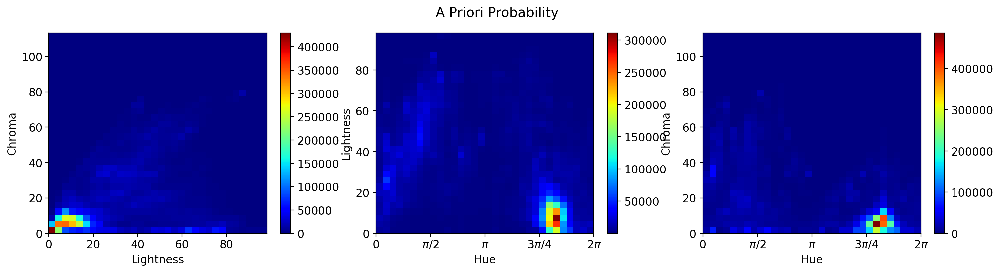

In [33]:
fig = plt.figure(figsize = [18,4], dpi = 200, facecolor = 'w')
BINS = 32
CMAP = 'jet'

plt.suptitle("A Priori Probability")
plt.subplot(131)
H, XX, YY, im = plt.hist2d(L_cave, C_cave, bins = BINS, cmap = CMAP, normed = False)
plt.ylabel("Chroma")
plt.xlabel("Lightness")
plt.colorbar()
plt.subplot(132)
H, XX, YY, im = plt.hist2d(H_cave, L_cave, bins = BINS, cmap = CMAP, normed = False)
plt.ylabel("Lightness")
plt.xlabel("Hue")

plt.xticks(np.linspace(0,2*np.pi,5),["0", "$\pi$/2",  "$\pi$", "3$\pi$/4", "2$\pi$"])
plt.colorbar()
plt.subplot(133)
H, XX, YY, im = plt.hist2d(H_cave, C_cave, bins = BINS, cmap = CMAP, normed = False)
plt.ylabel("Chroma")
plt.xlabel("Hue")
plt.xticks(np.linspace(0,2*np.pi,5),["0", "$\pi$/2",  "$\pi$", "3$\pi$/4", "2$\pi$"])
plt.colorbar()

In [34]:
XX_test = (XX*(BINS)).astype(int)
YY_test = (YY*(BINS)).astype(int)
m = len(H_cave)
h_test = (H_cave[:m]*32).astype(int)
c_test = (C_cave[:m]*32).astype(int)
h_ind = np.digitize(h_test, XX_test)-1
c_ind = np.digitize(c_test, YY_test)-1
count = np.fliplr(np.rot90(H,3))

count[count == 0] = 1

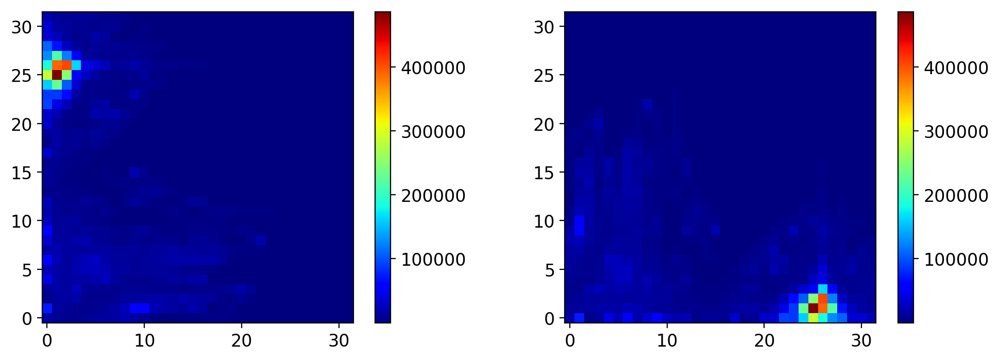

In [35]:
plt.figure(figsize = [12,4],dpi = 200)
plt.subplot(121)
plt.imshow(H, cmap = 'jet', origin = 'lower')
plt.colorbar()
plt.subplot(122)
plt.imshow(count, cmap = 'jet', origin = 'lower')
plt.colorbar()


In [ ]:
sum_matrix = np.zeros(shape = H.shape)
heat_matrix = np.zeros(shape = H.shape)

for i in range(len(metric)):
    error = metric[i]
    sum_matrix[c_ind[i]-32,h_ind[i]-32] += error


In [78]:
error_matrix = np.zeros(shape = H.shape)
error_list = error_matrix.flatten()

In [79]:
error_list.shape

(1024,)

In [84]:
ERR = []
for i in range(1024):
    e = []
    ERR.append(e)

In [91]:
for i in range(len(metric)):
    error = metric[i]
    x,y = c_ind[i],h_ind[i]
    m = (x-1)*32 + (y-1)
    ERR[m].append(error)

In [93]:
help(np.std)

Help on function std in module numpy:

std(a, axis=None, dtype=None, out=None, ddof=0, keepdims=<no value>)
    Compute the standard deviation along the specified axis.
    
    Returns the standard deviation, a measure of the spread of a distribution,
    of the array elements. The standard deviation is computed for the
    flattened array by default, otherwise over the specified axis.
    
    Parameters
    ----------
    a : array_like
        Calculate the standard deviation of these values.
    axis : None or int or tuple of ints, optional
        Axis or axes along which the standard deviation is computed. The
        default is to compute the standard deviation of the flattened array.
    
        .. versionadded:: 1.7.0
    
        If this is a tuple of ints, a standard deviation is performed over
        multiple axes, instead of a single axis or all the axes as before.
    dtype : dtype, optional
        Type to use in computing the standard deviation. For arrays of
       

In [94]:
MEAN = []
STD = []

for i in range(1024):
    MEAN.append(np.mean(ERR[i]))
    STD.append(np.std(ERR[i]))    

C:\Users\renep\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\renep\Anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\renep\Anaconda3\lib\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\renep\Anaconda3\lib\site-packages\numpy\core\_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
C:\Users\renep\Anaconda3\lib\site-packages\numpy\core\_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [98]:
MEAN = np.array(MEAN).reshape(32,32)
STD = np.array(STD).reshape(32,32)

### LCH Colorspace

In [36]:
def Error_Heat_Map(metric, ERROR, clip):
    
    sum_matrix = np.zeros(shape = H.shape)
    heat_matrix = np.zeros(shape = H.shape)

    for i in range(len(metric)):
        error = metric[i]
        sum_matrix[c_ind[i]-32,h_ind[i]-32] += error

    heat_matrix = sum_matrix/count
    heat_matrix[heat_matrix> clip] = clip

    fig = plt.figure(constrained_layout=False, dpi = 200, figsize=[15,9])
    fig.suptitle(str(ERROR))
    
    gs1 = fig.add_gridspec(nrows=2, ncols=2)# left=0.05, right=0.48, wspace=0.05)
    
    
    ax1 = fig.add_subplot(gs1[0, 0])

    ax1.set_title("Cummulative Error")
    im1 = ax1.imshow(sum_matrix, cmap = "jet", origin = "lower", extent=[0,2*np.pi,0,113], aspect='auto')
    ax1.set_xticks(np.linspace(0,2*np.pi,5))
    ax1.set_xticklabels(["0", "$\pi$/2",  "$\pi$", "3$\pi$/4", "2$\pi$"])
    ax1.set_xlabel("Hue")
    ax1.set_ylabel("Chroma")
    fig.colorbar(im1, shrink=0.8)

    ax2 = fig.add_subplot(gs1[0, 1])
    ax2.set_title("Average Error")
    im2 = ax2.imshow(heat_matrix, cmap = "jet", origin = "lower", extent=[0,2*np.pi,0,113], aspect='auto')
    ax2.set_xticks(np.linspace(0,2*np.pi,5))
    ax2.set_xticklabels(["0", "$\pi$/2",  "$\pi$", "3$\pi$/4", "2$\pi$"])
    ax2.set_xlabel("Hue")
    ax2.set_ylabel("Chroma")
    rect = Rectangle((0,0),2*np.pi,24,linewidth=3,edgecolor='r',facecolor='none')
    ax2.add_patch(rect)
    fig.colorbar(im2, shrink=0.8,label=str(ERROR))
    
    ax3 = fig.add_subplot(gs1[1, :])

    im3 = ax3.imshow(heat_matrix[:7,:], origin = "lower", cmap = 'jet', extent=[0,2*np.pi,0,24], aspect='auto')
    ax3.set_xticks(np.linspace(0,2*np.pi,5))
    ax3.set_xticklabels(["0", "$\pi$/2",  "$\pi$", "3$\pi$/4", "2$\pi$"])
    fig.colorbar(im3, shrink=0.8, label=str(ERROR))
    ax3.set_xlabel("Hue")
    ax3.set_ylabel("Chroma")
    
    ax3.patch.set_edgecolor('red')  
    ax3.patch.set_linewidth('5')  
   
    plt.show()
    


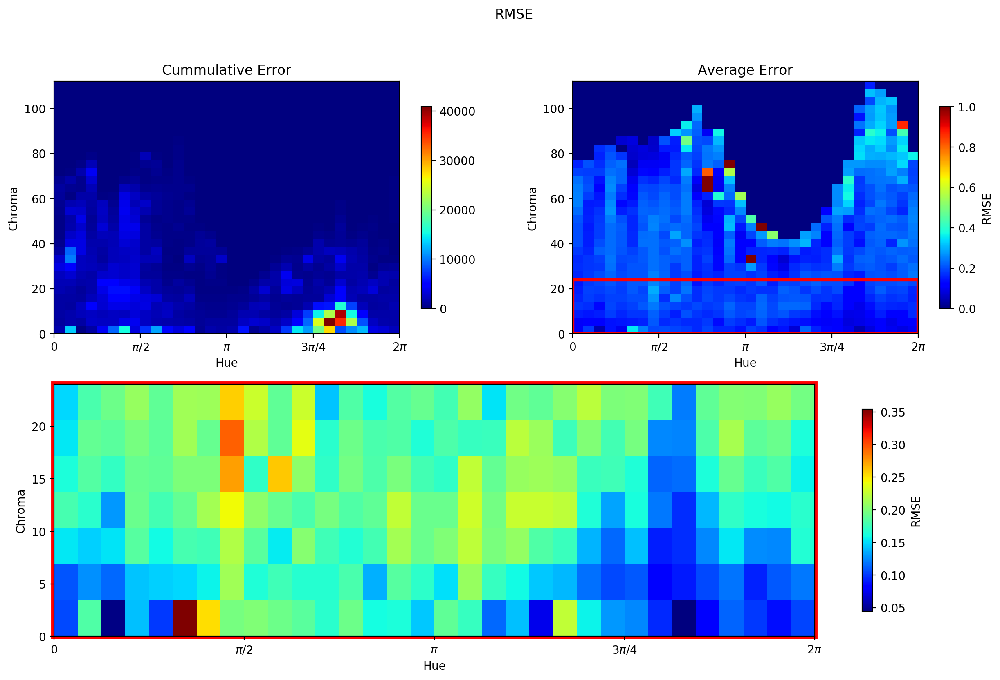

In [148]:
Error_Heat_Map(RMSE_overall[2], "RMSE", clip = 1)


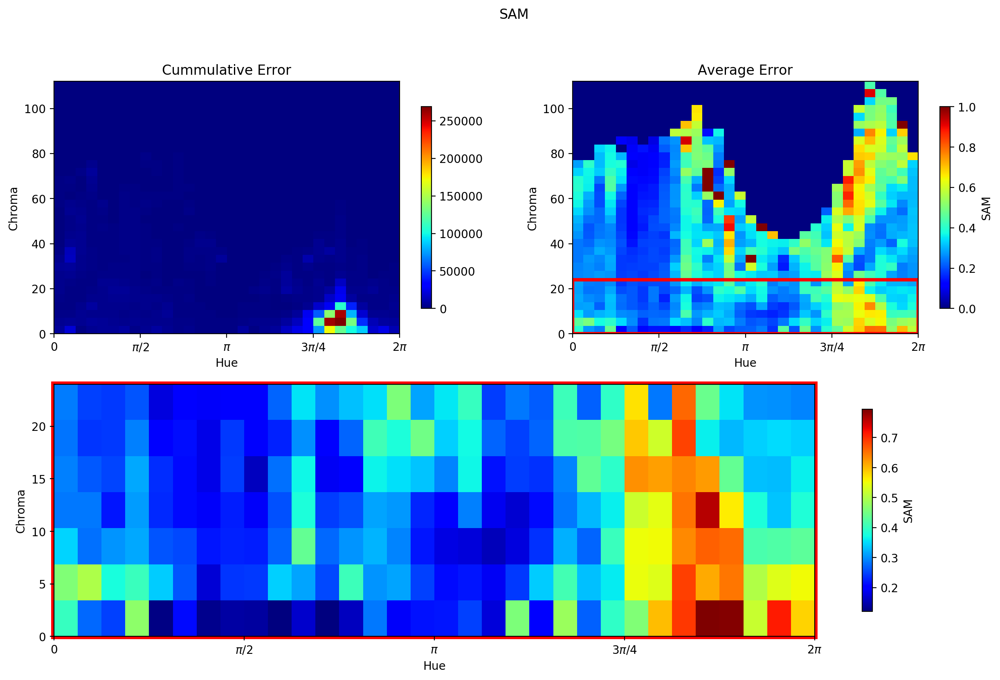

In [149]:
Error_Heat_Map(SAM_overall[2],"SAM", clip = 1)

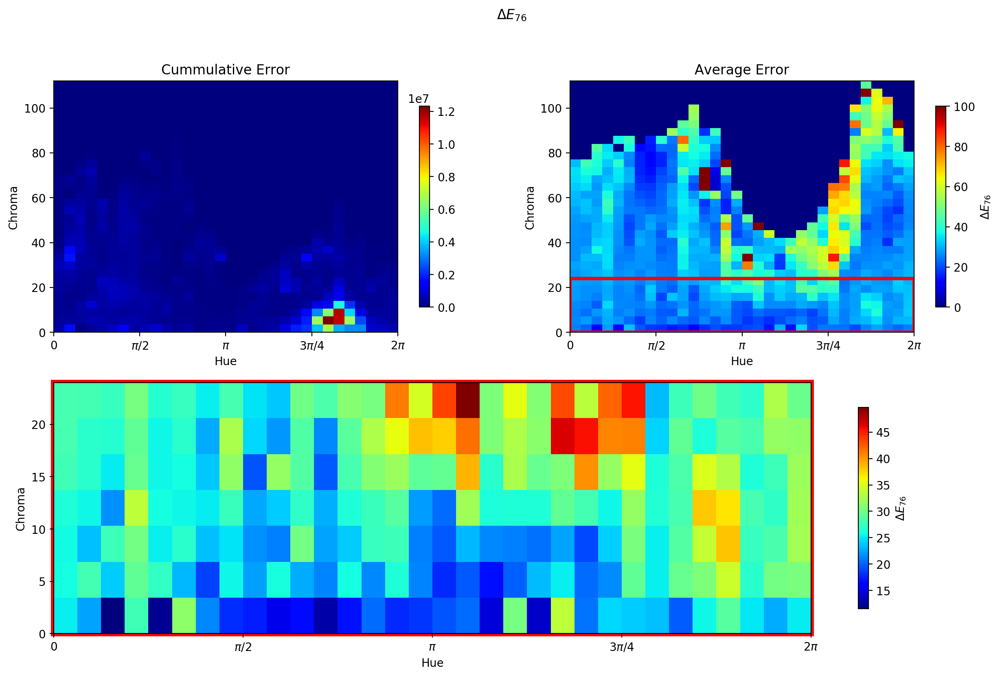

In [150]:
Error_Heat_Map(DE_76_overall[2], "$\Delta E_{76}$", clip = 100)

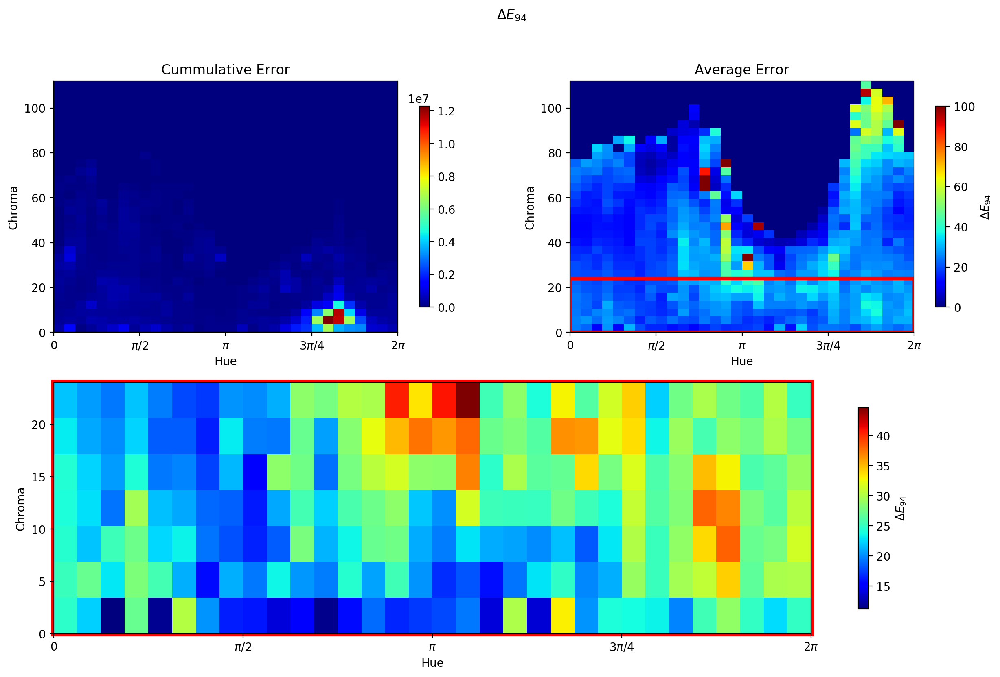

In [151]:
Error_Heat_Map(DE_CH_AB_overall[2], "$\Delta E_{94}$", clip = 100)

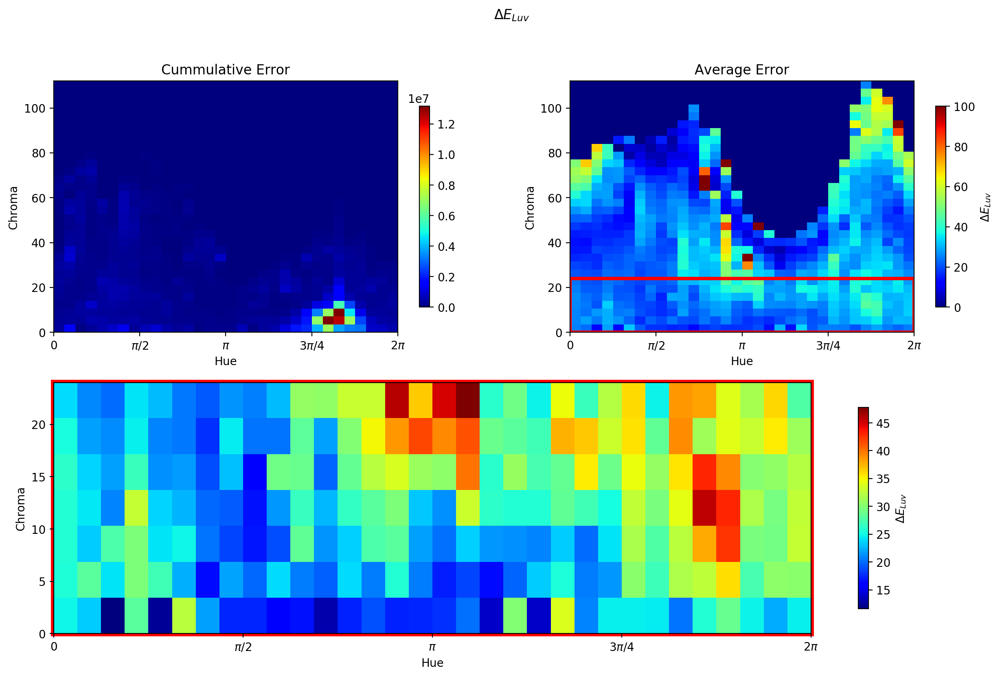

In [152]:
Error_Heat_Map(DE_CH_UV_overall[2], "$\Delta E_{Luv}$", clip = 100)

### LAB Colorspace

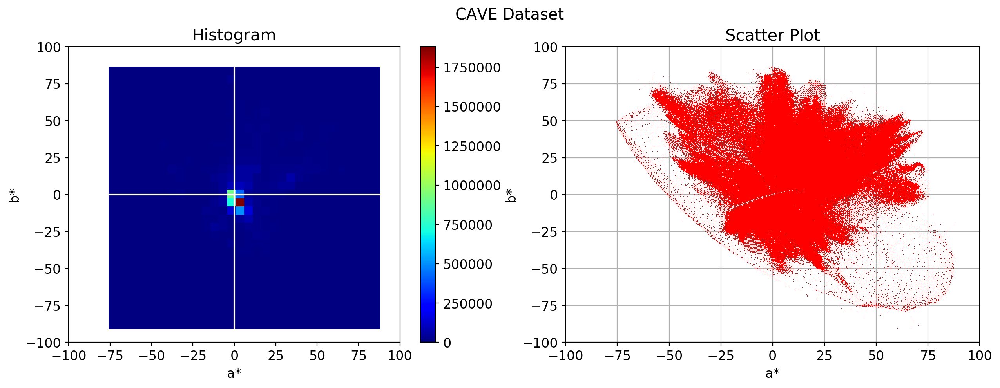

In [37]:
fig = plt.figure(figsize = [15,5], dpi = 200, facecolor = 'w')
CMAP = 'jet'

plt.suptitle("CAVE Dataset")
plt.subplot(121)
H_ab, XX_ab, YY_ab, im = plt.hist2d(A_cave, B_cave, bins = 32, cmap = CMAP)
plt.xlim(-100,100)
plt.ylim(-100,100)
plt.ylabel("b*")
plt.xlabel("a*")
plt.colorbar()
plt.title("Histogram")
plt.axhline(0, color = 'w')
plt.axvline(0, color = 'w')

plt.subplot(122)
plt.plot(A_cave, B_cave, 'r,')
plt.xlim(-100,100)
plt.ylim(-100,100)
plt.title("Scatter Plot")
plt.ylabel("b*")
plt.xlabel("a*")

plt.grid()

In [38]:
m = len(A_cave)
a_test = (A_cave[:m]).astype(int)
b_test = (B_cave[:m]).astype(int)
a_ind = np.digitize(a_test, XX_ab.astype(int))-1
b_ind = np.digitize(b_test, YY_ab.astype(int))-1

In [39]:
count_ab = H_ab
count_ab = np.fliplr(np.rot90(H_ab,3))
count_ab[count_ab == 0] = 0.0001

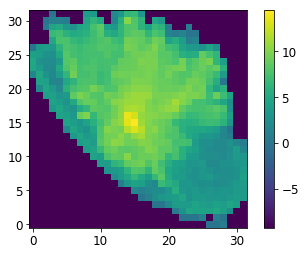

In [40]:
plt.imshow(np.log(count_ab), origin = 'lower')
plt.colorbar()

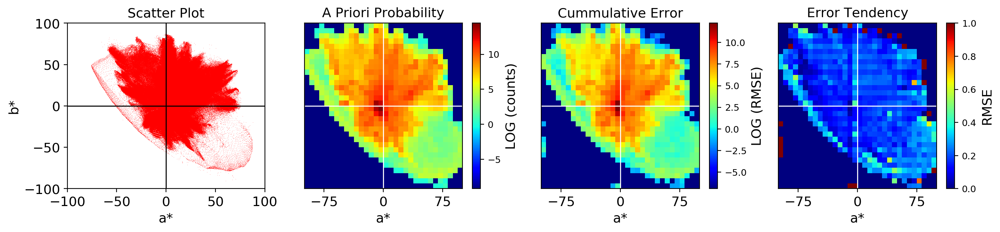

In [42]:
plt.rcParams['axes.titlesize'] = 13
plt.rcParams.update({'font.size': 13})

metric = RMSE_overall[0]
clip = 1
ERROR = "RMSE"

sum_matrix = np.zeros(shape = H_ab.shape)
heat_matrix = np.zeros(shape = H_ab.shape)

for i in range(len(metric)):
    error = metric[i]
    sum_matrix[b_ind[i]-32,a_ind[i]-32] += error

heat_matrix = sum_matrix/count_ab
heat_matrix[heat_matrix> clip] = clip
sum_matrix[sum_matrix==0] = 0.001

fig = plt.figure(constrained_layout=False, dpi = 200, figsize=[16,3], facecolor = 'w')
#fig.suptitle(str(ERROR))
gs1 = fig.add_gridspec(nrows=1, ncols=4)# left=0.05, right=0.48, wspace=0.05)

ax1 = fig.add_subplot(gs1[0, 0])
ax1.plot(A_cave, B_cave, 'r,', alpha = 0.5)
ax1.set_xlim(-100,100)
ax1.set_ylim(-100,100)
ax1.set_title("Scatter Plot")
ax1.set_ylabel("b*")
ax1.set_xlabel("a*")
ax1.axhline(0, color = 'k', linewidth = 1)
ax1.axvline(0, color = 'k', linewidth = 1)
#ax1.set_xticks([-75,0,75])


ax2 = fig.add_subplot(gs1[0, 1])
ax2.set_title("A Priori Probability")
im2 = ax2.imshow(np.log(count_ab), cmap = "jet", origin = "lower", extent=[-100,100,-100,100], aspect='auto')
ax2.set_xlabel("a*")
ax2.set_yticks([])
ax2.axhline(0, color = 'w', linewidth = 1)
ax2.axvline(0, color = 'w', linewidth = 1)
ax2.set_xticks([-75,0,75])
cbar = fig.colorbar(im2, shrink=1, label= "LOG (counts)")
cbar.ax.tick_params(labelsize=9) 

ax3 = fig.add_subplot(gs1[0, 2])
ax3.set_title("Cummulative Error")
im3 = ax3.imshow(np.log(sum_matrix), cmap = "jet", origin = "lower", extent=[-100,100,-100,100], aspect='auto')
ax3.set_xlabel("a*")
ax3.set_yticks([])
ax3.axhline(0, color = 'w', linewidth = 1)
ax3.axvline(0, color = 'w', linewidth = 1)
ax3.set_xticks([-75,0,75])
cbar = fig.colorbar(im3, shrink=1, label= "LOG (RMSE)")
cbar.ax.tick_params(labelsize=9) 

ax4 = fig.add_subplot(gs1[0, 3])
ax4.set_title("Error Tendency")
im4 = ax4.imshow(heat_matrix, cmap = "jet", origin = "lower", extent=[-100,100,-100,100], aspect='auto')
ax4.axhline(0, color = 'w', linewidth = 1)
ax4.axvline(0, color = 'w', linewidth = 1)
ax4.set_xlabel("a*")
ax4.set_yticks([])
ax4.set_xticks([-75,0,75])
cbar = fig.colorbar(im4, shrink=1, label= "RMSE")
cbar.ax.tick_params(labelsize=9) 



In [190]:
np.log(sum_matrix).astype(float)

array([[-6.9078e+00, -6.9078e+00, -6.9078e+00, ..., -6.9078e+00,
        -6.9078e+00, -6.9078e+00],
       [-6.9078e+00, -6.9078e+00, -6.9078e+00, ..., -6.9078e+00,
        -6.9078e+00, -6.9078e+00],
       [-6.9078e+00, -6.9078e+00, -6.9078e+00, ..., 1.5326e-01,
        -6.9078e+00, -6.9078e+00],
       ...,
       [-6.9078e+00, -6.9078e+00, -7.8128e-01, ..., -6.9078e+00,
        -6.9078e+00, -6.9078e+00],
       [-6.9078e+00, -6.9078e+00, -1.3051e+00, ..., -6.9078e+00,
        -6.9078e+00, -6.9078e+00],
       [-6.9078e+00, -6.9078e+00, -6.9078e+00, ..., -6.9078e+00,
        -6.9078e+00, -6.9078e+00]])

In [70]:
CMAP = 'plasma'

Text(0.5, 0, 'a*')

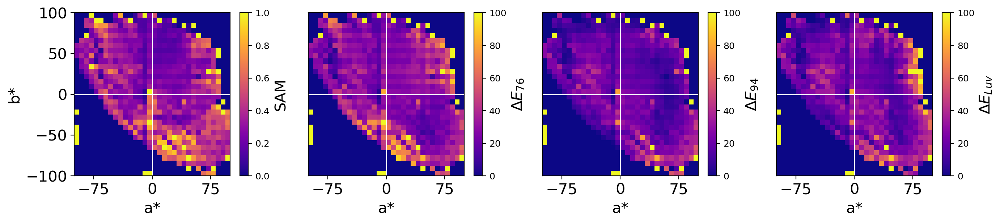

In [71]:
plt.rcParams['axes.titlesize'] = 13
plt.rcParams.update({'font.size': 15})

fig2 = plt.figure(constrained_layout=False, dpi = 200, figsize=[16,3], facecolor = 'w')
gs2 = fig.add_gridspec(nrows=1, ncols=4)# left=0.05, right=0.48, wspace=0.05)
ax1 = fig2.add_subplot(gs2[0, 0])
im1 = ax1.imshow(SAM_ave, cmap = CMAP, origin = "lower", extent=[-100,100,-100,100], aspect='auto')
cbar = fig2.colorbar(im1, shrink=1.0, label="SAM")
cbar.ax.tick_params(labelsize=9) 
ax1.axhline(0, color = 'w', linewidth = 1)
ax1.axvline(0, color = 'w', linewidth = 1)
ax1.set_ylabel("b*")
ax1.set_xlabel("a*")
ax1.set_xticks([-75,0,75])

ax2 = fig2.add_subplot(gs2[0, 1])
im2 = ax2.imshow(DE76_ave, cmap = CMAP, origin = "lower", extent=[-100,100,-100,100], aspect='auto')
cbar = fig2.colorbar(im2, shrink=1, label="$\Delta E_{76}$")
cbar.ax.tick_params(labelsize=9) 
ax2.set_yticks([])
ax2.axhline(0, color = 'w', linewidth = 1)
ax2.axvline(0, color = 'w', linewidth = 1)
ax2.set_xlabel("a*")
ax2.set_xticks([-75,0,75])


ax3 = fig2.add_subplot(gs2[0, 2])
im3 = ax3.imshow(DE94_ave, cmap = CMAP, origin = "lower", extent=[-100,100,-100,100], aspect='auto')
cbar = fig2.colorbar(im3, shrink=1, label="$\Delta E_{94}$")
cbar.ax.tick_params(labelsize=9) 
ax3.set_yticks([])
ax3.axhline(0, color = 'w', linewidth = 1)
ax3.axvline(0, color = 'w', linewidth = 1)
ax3.set_xlabel("a*")
ax3.set_xticks([-75,0,75])

ax4 = fig2.add_subplot(gs2[0, 3])
im4 = ax4.imshow(DELUV_ave, cmap = CMAP, origin = "lower", extent=[-100,100,-100,100], aspect='auto')
cbar = fig2.colorbar(im4, shrink=1, label="$\Delta E_{Luv}$")
cbar.ax.tick_params(labelsize=9) 
ax4.set_yticks([])
ax4.set_xticks([-75,0,75])
ax4.axhline(0, color = 'w', linewidth = 1)
ax4.axvline(0, color = 'w', linewidth = 1)
ax4.set_xlabel("a*")


In [47]:
def Error_AB(metric, clip, ERROR):

    sum_matrix = np.zeros(shape = H_ab.shape)
    heat_matrix = np.zeros(shape = H_ab.shape)

    for i in range(len(metric)):
        error = metric[i]
        sum_matrix[b_ind[i]-32,a_ind[i]-32] += error

    heat_matrix = sum_matrix/count_ab
    heat_matrix[heat_matrix> clip] = clip

    fig = plt.figure(constrained_layout=False, dpi = 200, figsize=[20,4])
    fig.suptitle(str(ERROR))
    gs1 = fig.add_gridspec(nrows=1, ncols=3)# left=0.05, right=0.48, wspace=0.05)

    ax1 = fig.add_subplot(gs1[0, 0])
    ax1.set_title("Cummulative Error")
    im1 = ax1.imshow(sum_matrix, cmap = "jet", origin = "lower", extent=[-100,100,-100,100], aspect='auto')
    ax1.set_xlabel("a*")
    ax1.set_ylabel("b*")
    ax1.axhline(0, color = 'w', linewidth = 1)
    ax1.axvline(0, color = 'w', linewidth = 1)
    fig.colorbar(im1, shrink=0.8)

    ax2 = fig.add_subplot(gs1[0, 1])
    ax2.set_title("Average Error")
    im2 = ax2.imshow(heat_matrix, cmap = "jet", origin = "lower", extent=[-100,100,-100,100], aspect='auto')
    ax2.axhline(0, color = 'w', linewidth = 1)
    ax2.axvline(0, color = 'w', linewidth = 1)
    ax2.set_xlabel("a*")
    ax2.set_ylabel("b*")

    rect = Rectangle((-25,-25),50,50,linewidth=3,edgecolor='r',facecolor='none')
    ax2.add_patch(rect)
    fig.colorbar(im2, shrink=0.8,label=str(ERROR))
    
    ax3 = fig.add_subplot(gs1[0,2])
    ax3.axhline(0, color = 'w', linewidth = 5)
    ax3.axvline(0, color = 'w', linewidth = 5)
    im3 = ax3.imshow(heat_matrix[11:21,11:21], origin = "lower", cmap = 'jet', extent=[-24,26,-24,26], aspect='auto')
    fig.colorbar(im3, shrink=0.8, label=str(ERROR))
    ax3.set_xlabel("a*")
    ax3.set_ylabel("b*")

    ax3.patch.set_edgecolor('red')  
    ax3.patch.set_linewidth('5')
    
    return heat_matrix


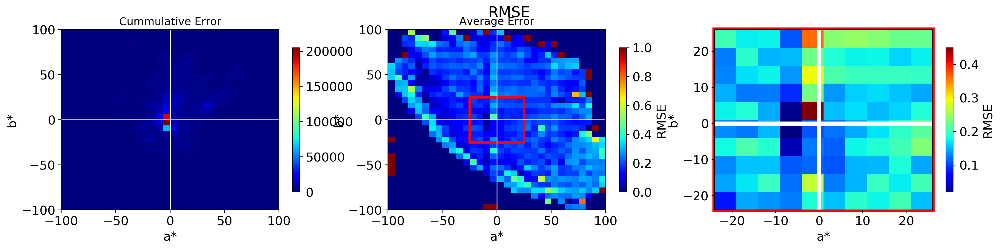

In [52]:
RMSE_ave = Error_AB(RMSE_overall[0], 1, "RMSE")

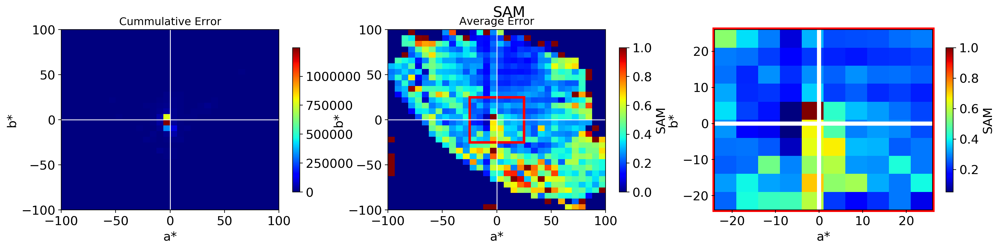

In [53]:
SAM_ave = Error_AB(SAM_overall[0], 1, "SAM")

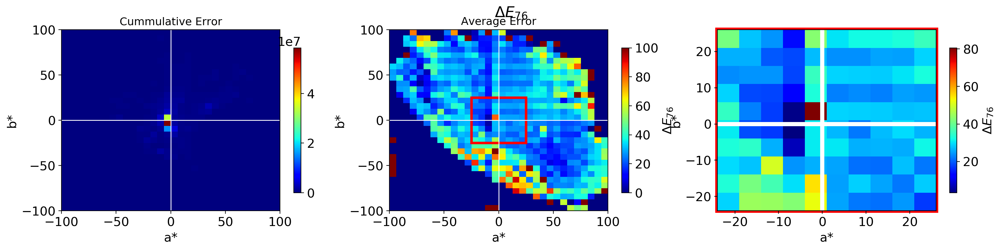

In [54]:
DE76_ave = Error_AB(DE_76_overall[0], 100, "$\Delta E_{76}$")

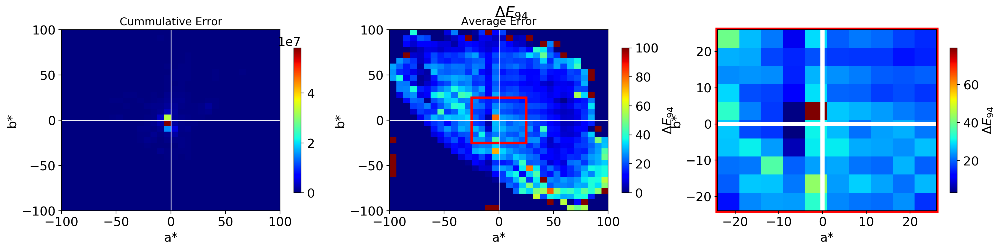

In [55]:
DE94_ave = Error_AB(DE_CH_AB_overall[0], 100, "$\Delta E_{94}$")

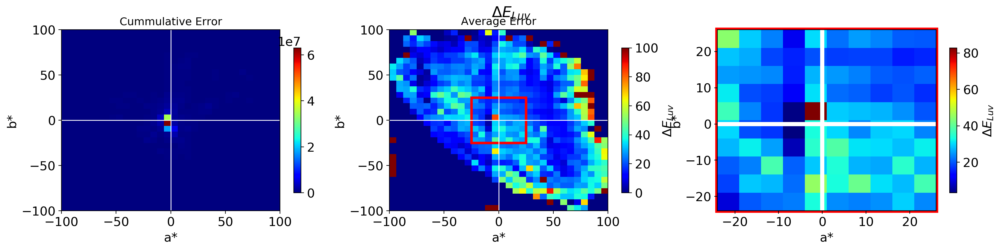

In [58]:
DELUV_ave = Error_AB(DE_CH_UV_overall[0], 100, "$\Delta E_{Luv}$")

In [22]:
n = 2
len(RMSE_overall[n])

8388608

<Figure size 1200x800 with 0 Axes>

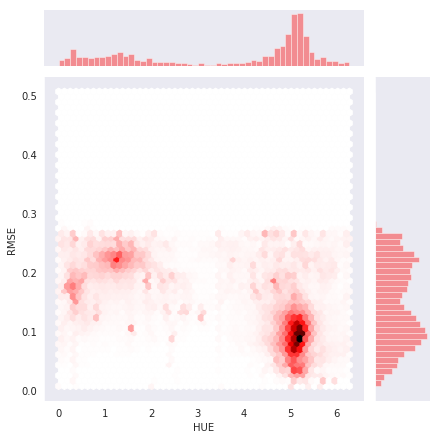

In [80]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(H_cave, RMSE_overall[n], kind="hex", color="r")).set_axis_labels("HUE","RMSE")

<Figure size 1200x800 with 0 Axes>

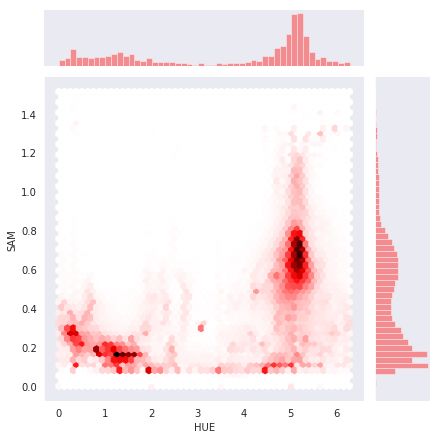

In [81]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(H_cave, SAM_overall[n], kind="hex", color="r")).set_axis_labels("HUE","SAM")

<Figure size 1200x800 with 0 Axes>

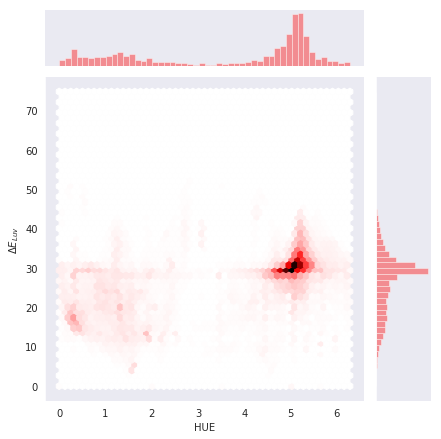

In [82]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(H_cave, DE_CH_UV_overall[n], kind="hex", color="r")).set_axis_labels("HUE","$\Delta E_{Luv}$")

<Figure size 1200x800 with 0 Axes>

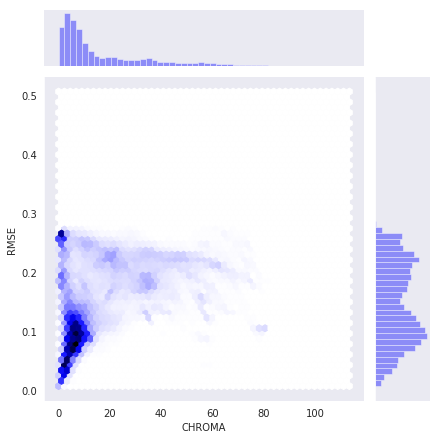

In [83]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(C_cave, RMSE_overall[n], kind="hex", color="b")).set_axis_labels("CHROMA","RMSE")

<Figure size 1200x800 with 0 Axes>

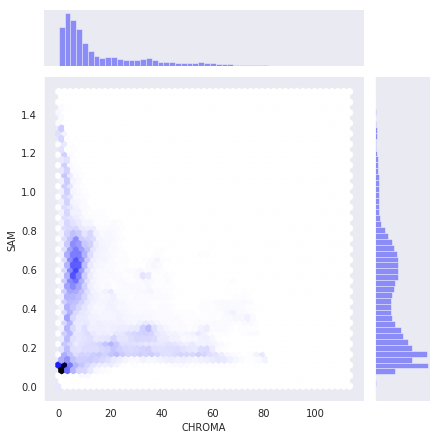

In [84]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(C_cave, SAM_overall[n], kind="hex", color="b")).set_axis_labels("CHROMA","SAM")

<Figure size 1200x800 with 0 Axes>

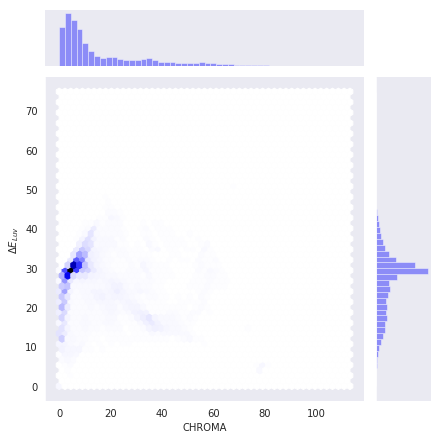

In [85]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(C_cave, DE_CH_UV_overall[n], kind="hex", color="b")).set_axis_labels("CHROMA","$\Delta E_{Luv}$")

In [ ]:
plt.figure(dpi = 200)
with sns.axes_style("dark"):
    (sns.jointplot(H_cave, RMSE_overall[n], kind="hex", color="b")).set_axis_labels("CHROMA","RMSE")

In [129]:
help(sns.jointplot)

Help on function jointplot in module seaborn.axisgrid:

jointplot(x, y, data=None, kind='scatter', stat_func=None, color=None, height=6, ratio=5, space=0.2, dropna=True, xlim=None, ylim=None, joint_kws=None, marginal_kws=None, annot_kws=None, **kwargs)
    Draw a plot of two variables with bivariate and univariate graphs.
    
    This function provides a convenient interface to the :class:`JointGrid`
    class, with several canned plot kinds. This is intended to be a fairly
    lightweight wrapper; if you need more flexibility, you should use
    :class:`JointGrid` directly.
    
    Parameters
    ----------
    x, y : strings or vectors
        Data or names of variables in ``data``.
    data : DataFrame, optional
        DataFrame when ``x`` and ``y`` are variable names.
    kind : { "scatter" | "reg" | "resid" | "kde" | "hex" }, optional
        Kind of plot to draw.
    stat_func : callable or None, optional
        *Deprecated*
    color : matplotlib color, optional
        Colo

(0, 1)

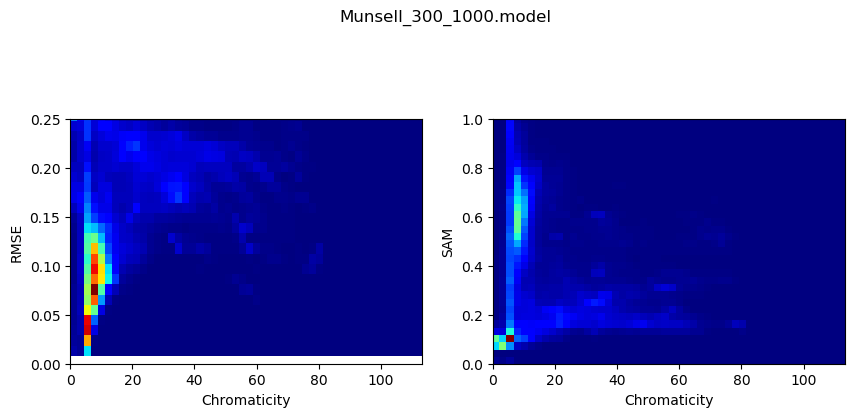

In [46]:
m = 3
fig = plt.figure(figsize = [10,11], dpi = 100, facecolor = 'w')
BINS = 50
CMAP = 'jet'
plt.suptitle(MODELS[m])
plt.subplot(321)
H, XX, YY, im = plt.hist2d(chromaticity, RMSE_overall[m], bins = BINS, cmap = CMAP, normed = True)
plt.ylabel("RMSE")
plt.xlabel("Chromaticity")
plt.ylim(0,0.25)
#plt.colorbar()
plt.subplot(322)
H, XX, YY, im = plt.hist2d(chromaticity, SAM_overall[m], bins = BINS, cmap = CMAP, normed = True)
plt.ylabel("SAM")
plt.xlabel("Chromaticity")
plt.ylim(0,1)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.21s/it]


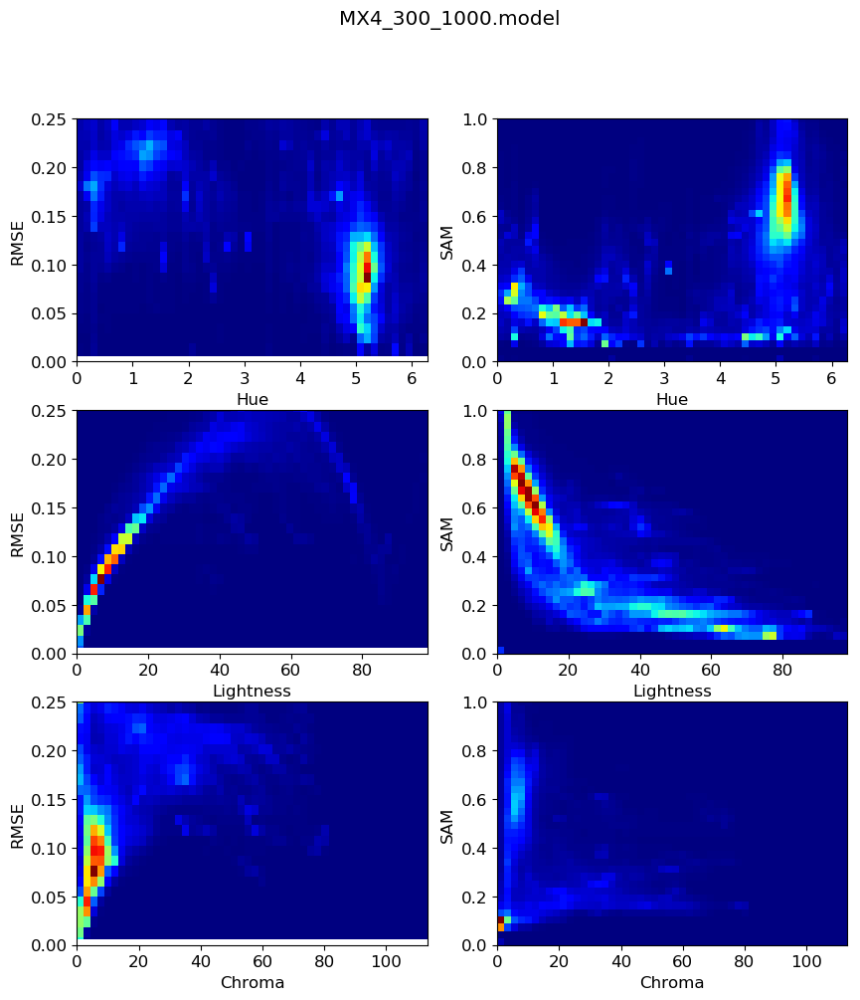

In [38]:
fig = plt.figure(figsize = [10,11], dpi = 100, facecolor = 'w')
BINS = 50
CMAP = 'jet'
for m in tqdm(range(4)):
    
        
    plt.suptitle(MODELS[m])
    plt.subplot(321)
    H, XX, YY, im = plt.hist2d(H_cave, RMSE_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("RMSE")
    plt.xlabel("Hue")
    plt.ylim(0,0.25)
    #plt.colorbar()
    plt.subplot(322)
    H, XX, YY, im = plt.hist2d(H_cave, SAM_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("SAM")
    plt.xlabel("Hue")
    plt.ylim(0,1)

    plt.subplot(323)
    H, XX, YY, im = plt.hist2d(L_cave, RMSE_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("RMSE")
    plt.xlabel("Lightness")
    plt.ylim(0,0.25)
    plt.subplot(324)
    H, XX, YY, im = plt.hist2d(L_cave, SAM_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("SAM")
    plt.xlabel("Lightness")
    plt.ylim(0,1)

    plt.subplot(325)
    H, XX, YY, im = plt.hist2d(C_cave, RMSE_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("RMSE")
    plt.xlabel("Chroma")
    plt.ylim(0,0.25)
    plt.subplot(326)
    H, XX, YY, im = plt.hist2d(C_cave, SAM_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("SAM")
    plt.xlabel("Chroma")
    plt.ylim(0,1)
     
    plt.savefig(results_path + "2DHist(Spectral)" + str(m) + ".png")
    #plt.show()



In [45]:
help(plt.hist2d)

Help on function hist2d in module matplotlib.pyplot:

hist2d(x, y, bins=10, range=None, normed=False, weights=None, cmin=None, cmax=None, *, data=None, **kwargs)
    Make a 2D histogram plot.
    
    Parameters
    ----------
    x, y : array_like, shape (n, )
        Input values
    
    bins : None or int or [int, int] or array_like or [array, array]
    
        The bin specification:
    
            - If int, the number of bins for the two dimensions
              (nx=ny=bins).
    
            - If ``[int, int]``, the number of bins in each dimension
              (nx, ny = bins).
    
            - If array_like, the bin edges for the two dimensions
              (x_edges=y_edges=bins).
    
            - If ``[array, array]``, the bin edges in each dimension
              (x_edges, y_edges = bins).
    
        The default value is 10.
    
    range : array_like shape(2, 2), optional, default: None
         The leftmost and rightmost edges of the bins along each dimension
  








  0%|                                                                                            | 0/4 [00:00<?, ?it/s]






 25%|█████████████████████                                                               | 1/4 [00:02<00:08,  2.99s/it]






 50%|██████████████████████████████████████████                                          | 2/4 [00:06<00:06,  3.00s/it]






 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:09<00:03,  3.07s/it]






100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.12s/it]

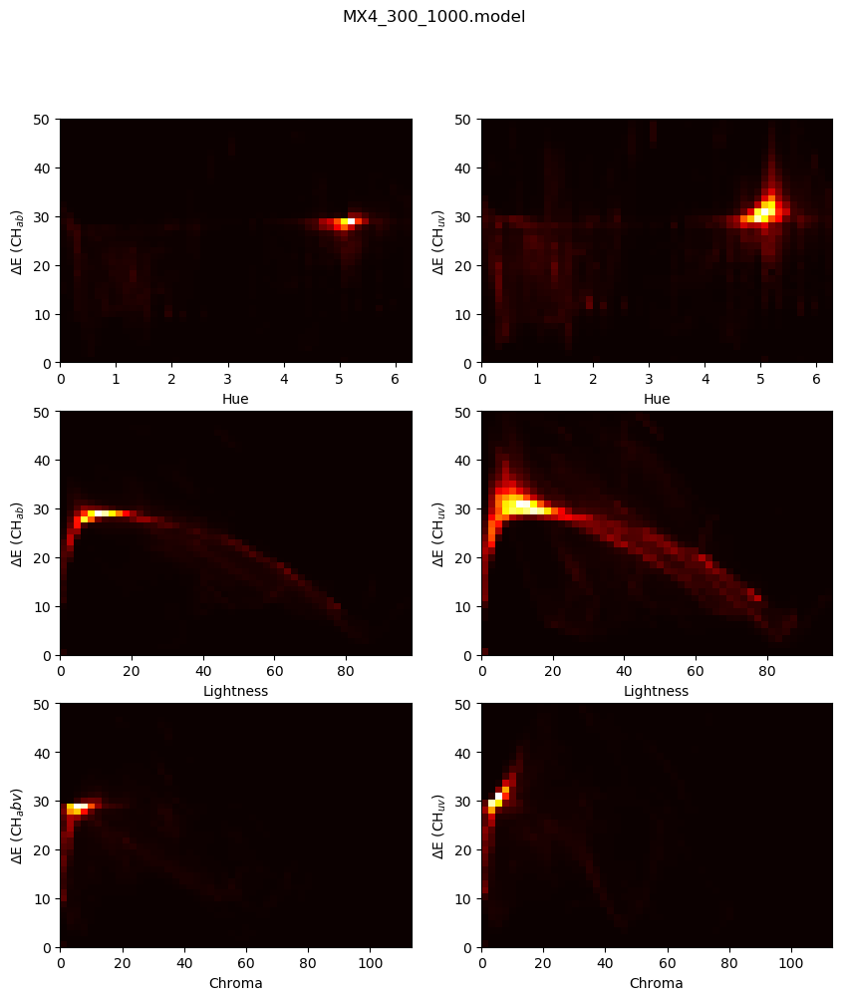

In [204]:
fig = plt.figure(figsize = [10,11], dpi = 100, facecolor = 'w')
BINS = 50

for m in tqdm(range(4)):
            
    plt.suptitle(MODELS[m])
    plt.subplot(321)
    H, XX, YY, im = plt.hist2d(H_cave, DE_CH_AB_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("$\Delta$E (CH$_{ab}$)")
    plt.xlabel("Hue")
    plt.ylim(0,50)
    plt.subplot(322)
    H, XX, YY, im = plt.hist2d(H_cave, DE_CH_UV_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("$\Delta$E (CH$_{uv}$)")
    plt.xlabel("Hue")
    plt.ylim(0,50)

    plt.subplot(323)
    H, XX, YY, im = plt.hist2d(L_cave, DE_CH_AB_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("$\Delta$E (CH$_{ab}$)")
    plt.xlabel("Lightness")
    plt.ylim(0,50)
    plt.subplot(324)
    H, XX, YY, im = plt.hist2d(L_cave, DE_CH_UV_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("$\Delta$E (CH$_{uv}$)")
    plt.xlabel("Lightness")
    plt.ylim(0,50)

    plt.subplot(325)
    H, XX, YY, im = plt.hist2d(C_cave, DE_CH_AB_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("$\Delta$E (CH$_abv}$)")
    plt.xlabel("Chroma")
    plt.ylim(0,50)
    plt.subplot(326)
    H, XX, YY, im = plt.hist2d(C_cave, DE_CH_UV_overall[m], bins = BINS, cmap = CMAP, normed = True)
    plt.ylabel("$\Delta$E (CH$_{uv}$)")
    plt.xlabel("Chroma")
    plt.ylim(0,50)
     
    plt.savefig(results_path + "2DHist(Colorimetric)" + str(m) + ".png")




  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

  0%|                                                                                           | 0/32 [00:00<?, ?it/s]

  3%|██▌                                                                                | 1/32 [00:00<00:10,  2.89it/s]

  6%|█████▏                                                                             | 2/32 [00:00<00:09,  3.08it/s]

  9%|███████▊                                                                           | 3/32 [00:00<00:08,  3.27it/s]

 12%|██████████▍                                                                        | 4/32 [00:01<00:08,  3.37it/s]

 16%|████████████▉                                                                      | 5/32 [00:01<00:07,  3.49it/s]

 19%|███████████████▌                                                                   | 6/32 [00:01<00:07,  3.54it/s]

 22%|██████████████████▏       

 97%|███████████████████████████████████████████████████████████████████████████████▍  | 31/32 [00:09<00:00,  3.59it/s]

 80%|███████████████████████████████████████████████████████████████████▏                | 4/5 [00:44<00:11, 11.47s/it]

  0%|                                                                                           | 0/32 [00:00<?, ?it/s]

  3%|██▌                                                                                | 1/32 [00:00<00:08,  3.51it/s]

  6%|█████▏                                                                             | 2/32 [00:00<00:08,  3.36it/s]

  9%|███████▊                                                                           | 3/32 [00:00<00:08,  3.41it/s]

 12%|██████████▍                                                                        | 4/32 [00:01<00:07,  3.53it/s]

 16%|████████████▉                                                                      | 5/32 [00:01<00:07,  3.68it/s]

 19%|███████████████▌           

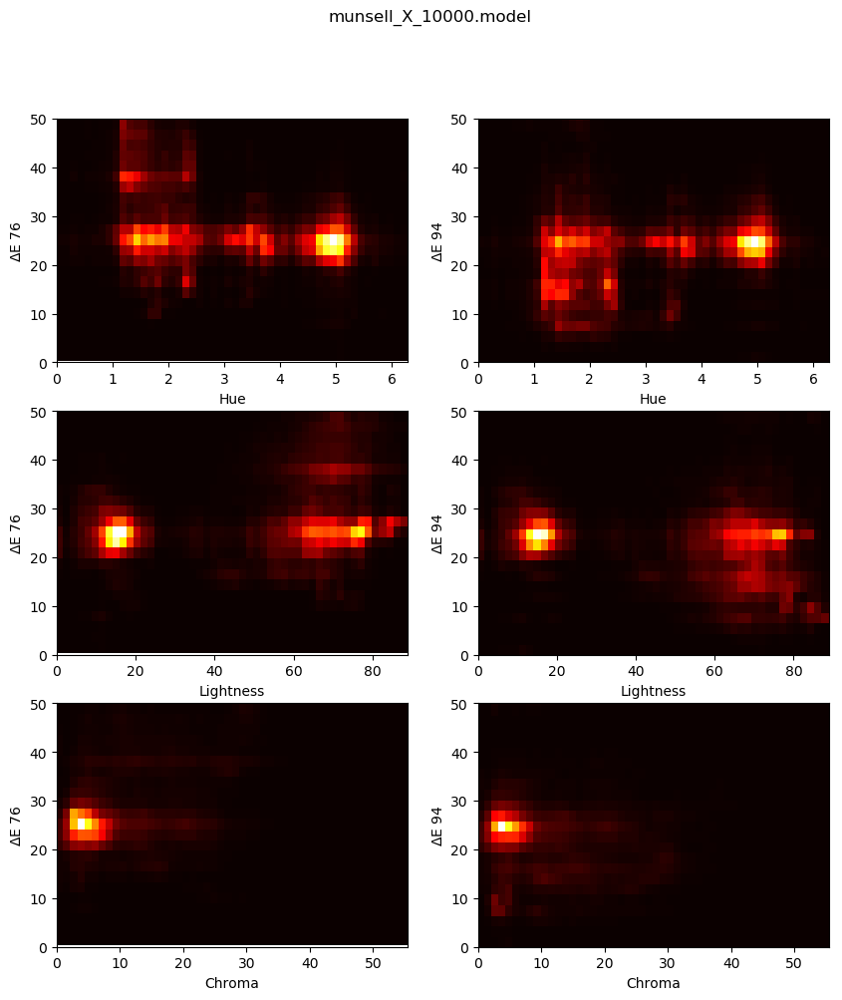

In [21]:
fig = plt.figure(figsize = [10,11], dpi = 100, facecolor = 'w')
BINS = 50
for m in tqdm(range(5)):
    for n in tqdm(range(32)):

        plt.suptitle(munsell_trained_models[m])
        LAB = rgb2lab(INPUT[n])
        LCH = lab2lch(LAB)

        plt.subplot(321)
        H, XX, YY, im = plt.hist2d(LCH[:,:,2].ravel(), (DE_76_overall[m][i]).ravel(), bins = BINS, cmap = 'hot', normed = True)
        plt.ylabel("$\Delta$E 76")
        plt.xlabel("Hue")
        plt.ylim(0,50)
        plt.subplot(322)
        H, XX, YY, im = plt.hist2d(LCH[:,:,2].ravel(), (DE_94_overall[m][i]).ravel(), bins = BINS, cmap = 'hot', normed = True)
        plt.ylabel("$\Delta$E 94")
        plt.xlabel("Hue")
        plt.ylim(0,50)
        
        
        plt.subplot(323)
        H, XX, YY, im = plt.hist2d(LCH[:,:,0].ravel(), (DE_76_overall[m][i]).ravel(), bins = BINS, cmap = 'hot', normed = True)
        plt.ylabel("$\Delta$E 76")
        plt.xlabel("Lightness")
        plt.ylim(0,50)
        plt.subplot(324)
        H, XX, YY, im = plt.hist2d(LCH[:,:,0].ravel(), (DE_94_overall[m][i]).ravel(), bins = BINS, cmap = 'hot', normed = True)
        plt.ylabel("$\Delta$E 94")
        plt.xlabel("Lightness")
        plt.ylim(0,50)
        
        plt.subplot(325)
        H, XX, YY, im = plt.hist2d(LCH[:,:,1].ravel(), (DE_76_overall[m][i]).ravel(), bins = BINS, cmap = 'hot', normed = True)
        plt.ylabel("$\Delta$E 76")
        plt.xlabel("Chroma")
        plt.ylim(0,50)
        plt.subplot(326)
        H, XX, YY, im = plt.hist2d(LCH[:,:,1].ravel(), (DE_94_overall[m][i]).ravel(), bins = BINS, cmap = 'hot', normed = True)
        plt.ylabel("$\Delta$E 94")
        plt.xlabel("Chroma")
        plt.ylim(0,50)
    plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM8/2DHist(Colorimetric)_" + str(m) + ".png")

### Scatterplots

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:01<00:00, 17.90it/s]


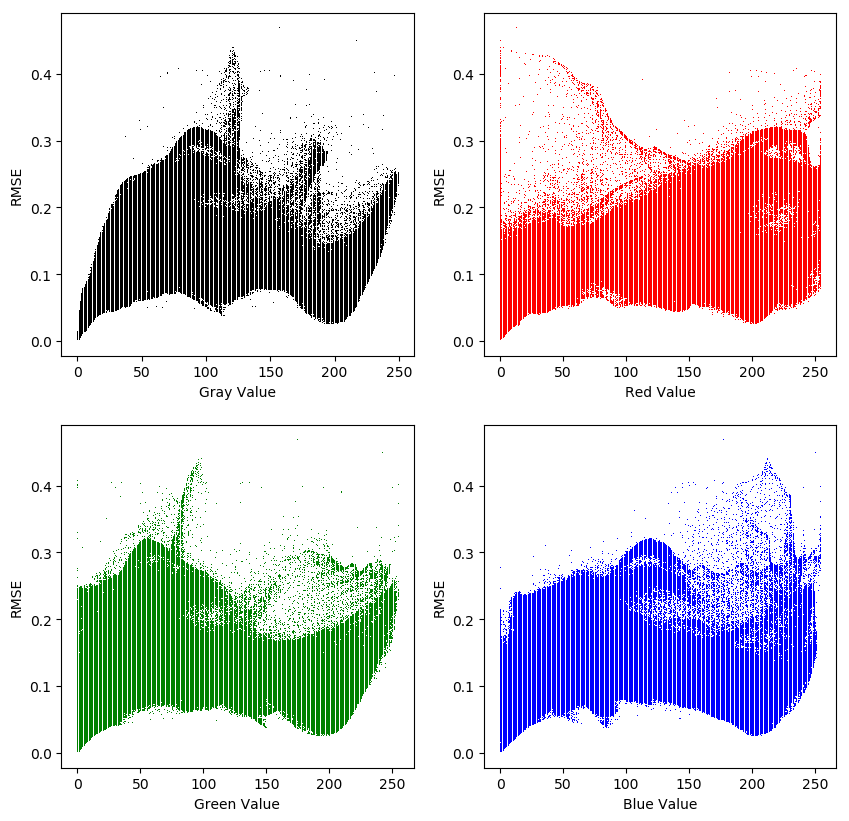

In [62]:
fig = plt.figure(figsize = [10,10], dpi = 100, facecolor = 'w')
for i in tqdm(range(32)):
    image = INPUT[i]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(221)
    plt.plot(gray.flatten(),  RMSE_overall[0][i].flatten(), 'k,')
    plt.ylabel("RMSE")
    plt.xlabel("Gray Value")
    plt.subplot(222)
    plt.plot(image[:,:,0].flatten(),RMSE_overall[0][i].flatten(), 'r,')
    plt.ylabel("RMSE")
    plt.xlabel("Red Value")
    plt.subplot(223)
    plt.plot(image[:,:,1].flatten(),RMSE_overall[0][i].flatten(), 'g,')
    plt.ylabel("RMSE")
    plt.xlabel("Green Value")
    plt.subplot(224)
    plt.plot(image[:,:,2].flatten(),RMSE_overall[0][i].flatten(), 'b,')
    plt.ylabel("RMSE")
    plt.xlabel("Blue Value")
    
plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM7/2DScatter_RMSE.png")
plt.show()
    

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:03<00:00, 10.07it/s]


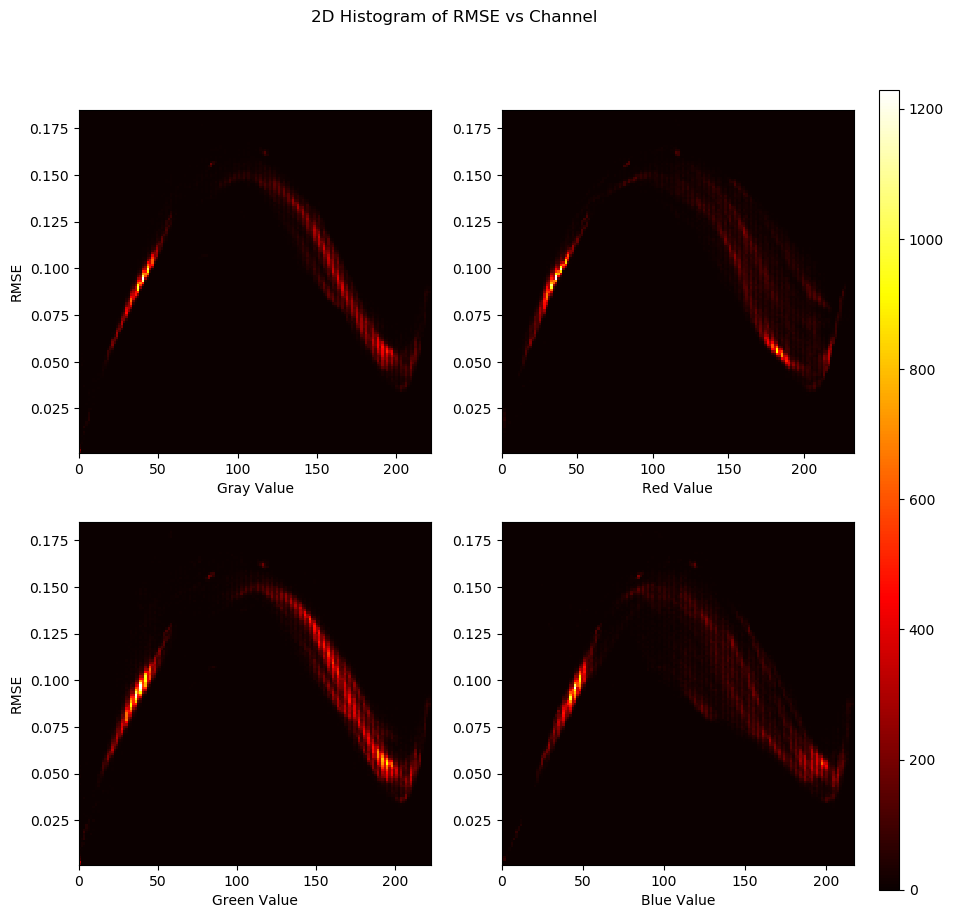

In [77]:
fig = plt.figure(figsize = [10,10], dpi = 100, facecolor = 'w')
BINS = 150
plt.suptitle("2D Histogram of RMSE vs Channel")
for i in tqdm(range(32)):
    image = INPUT[i]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(221)
    H, XX, YY, im = plt.hist2d(gray.ravel(), (RMSE_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)
    plt.ylabel("RMSE")
    plt.xlabel("Gray Value")
    plt.subplot(222)
    H, XX, YY, im = plt.hist2d(image[:,:,0].ravel(), (RMSE_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)    plt.ylabel("RMSE")
    plt.xlabel("Red Value")
    plt.subplot(223)
    H, XX, YY, im = plt.hist2d(image[:,:,1].ravel(), (RMSE_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)    plt.ylabel("RMSE")
    plt.ylabel("RMSE")
    plt.xlabel("Green Value")
    plt.subplot(224)
    H, XX, YY, im = plt.hist2d(image[:,:,2].ravel(), (RMSE_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)    plt.ylabel("RMSE")
    plt.xlabel("Blue Value")
    
cax = fig.add_axes([0.925, 0.1, 0.02, 0.8])
fig.colorbar(im, cax = cax, orientation='vertical')
plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM7/2DHistogram_RMSE.png")
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:01<00:00, 18.05it/s]


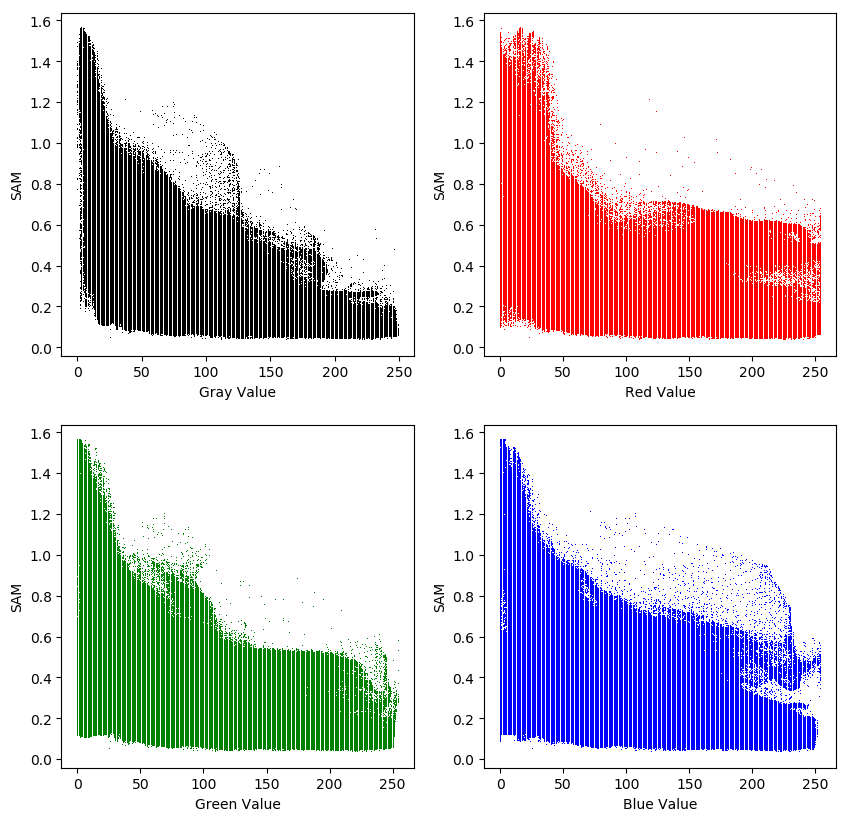

In [64]:
fig = plt.figure(figsize = [10,10], dpi = 100, facecolor = 'w')
for i in tqdm(range(32)):
    image = INPUT[i]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(221)
    plt.plot(gray.flatten(),  SAM_overall[0][i].flatten(), 'k,')
    plt.ylabel("SAM")
    plt.xlabel("Gray Value")
    plt.subplot(222)
    plt.plot(image[:,:,0].flatten(),SAM_overall[0][i].flatten(), 'r,')
    plt.ylabel("SAM")
    plt.xlabel("Red Value")
    plt.subplot(223)
    plt.plot(image[:,:,1].flatten(),SAM_overall[0][i].flatten(), 'g,')
    plt.ylabel("SAM")
    plt.xlabel("Green Value")
    plt.subplot(224)
    plt.plot(image[:,:,2].flatten(),SAM_overall[0][i].flatten(), 'b,')
    plt.ylabel("SAM")
    plt.xlabel("Blue Value")
    
plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM7/2DScatter_SAM.png")
plt.show()
    


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:05<00:00,  4.04it/s]

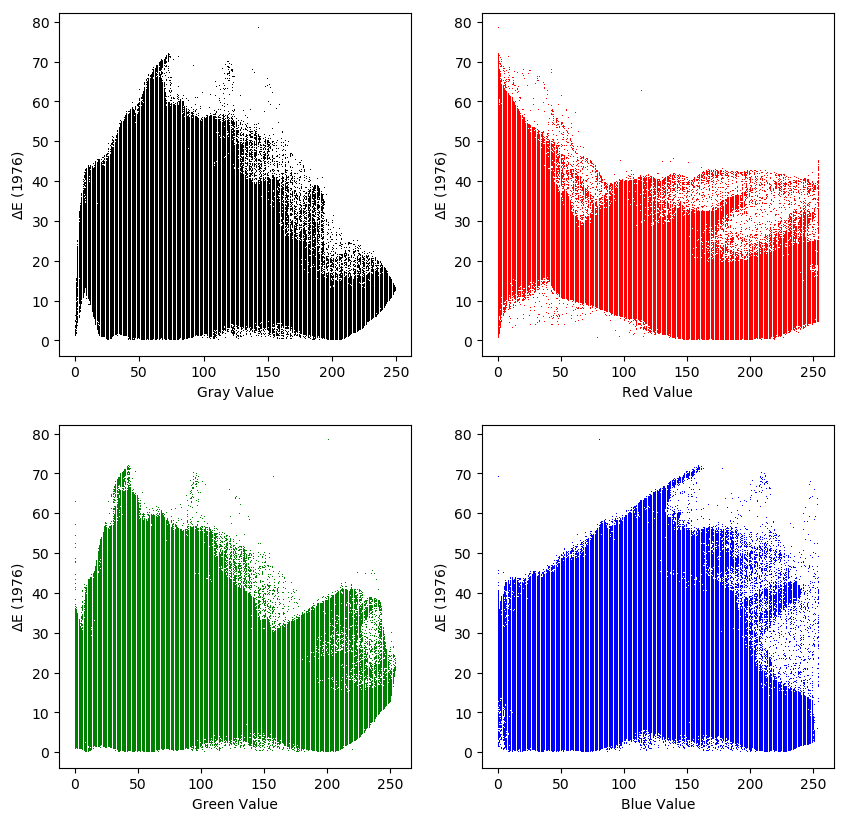

In [117]:
fig = plt.figure(figsize = [10,10], dpi = 100, facecolor = 'w')
for i in tqdm(range(32)):
    image = INPUT[i]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(221)
    plt.plot(gray.flatten(),  DE_76_overall[0][i].flatten(), 'k,')
    plt.ylabel("$\Delta$E (1976)")
    plt.xlabel("Gray Value")
    plt.subplot(222)
    plt.plot(image[:,:,0].flatten(),DE_76_overall[0][i].flatten(), 'r,')
    plt.ylabel("$\Delta$E (1976)")
    plt.xlabel("Red Value")
    plt.subplot(223)
    plt.plot(image[:,:,1].flatten(),DE_76_overall[0][i].flatten(), 'g,')
    plt.ylabel("$\Delta$E (1976)")
    plt.xlabel("Green Value")
    plt.subplot(224)
    plt.plot(image[:,:,2].flatten(),DE_76_overall[0][i].flatten(), 'b,')
    plt.ylabel("$\Delta$E (1976)")
    plt.xlabel("Blue Value")
    
plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM7/2DHistogram_DE76.png")
plt.show()
    


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:02<00:00, 11.87it/s]

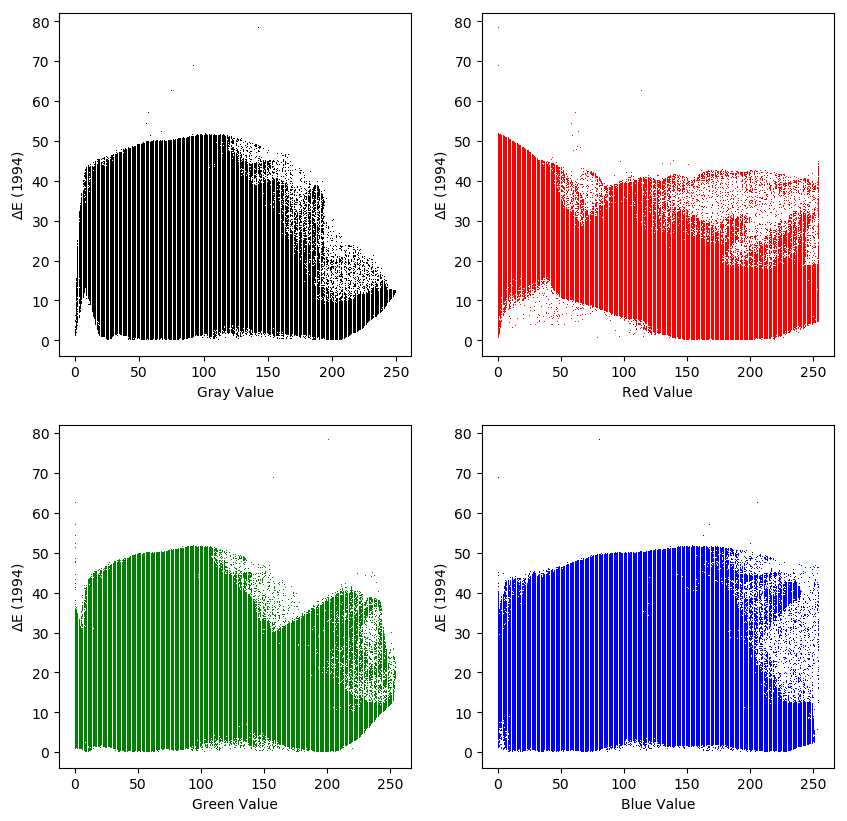

In [118]:
fig = plt.figure(figsize = [10,10], dpi = 100, facecolor = 'w')
for i in tqdm(range(32)):
    image = INPUT[i]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(221)
    plt.plot(gray.flatten(),  DE_94_overall[0][i].flatten(), 'k,')
    plt.ylabel("$\Delta$E (1994)")
    plt.xlabel("Gray Value")
    plt.subplot(222)
    plt.plot(image[:,:,0].flatten(),DE_94_overall[0][i].flatten(), 'r,')
    plt.ylabel("$\Delta$E (1994)")
    plt.xlabel("Red Value")
    plt.subplot(223)
    plt.plot(image[:,:,1].flatten(),DE_94_overall[0][i].flatten(), 'g,')
    plt.ylabel("$\Delta$E (1994)")
    plt.xlabel("Green Value")
    plt.subplot(224)
    plt.plot(image[:,:,2].flatten(),DE_94_overall[0][i].flatten(), 'b,')
    plt.ylabel("$\Delta$E (1994)")
    plt.xlabel("Blue Value")

        
plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM7/2DHistogram_DE94.png")
plt.show()
    

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:02<00:00, 12.68it/s]


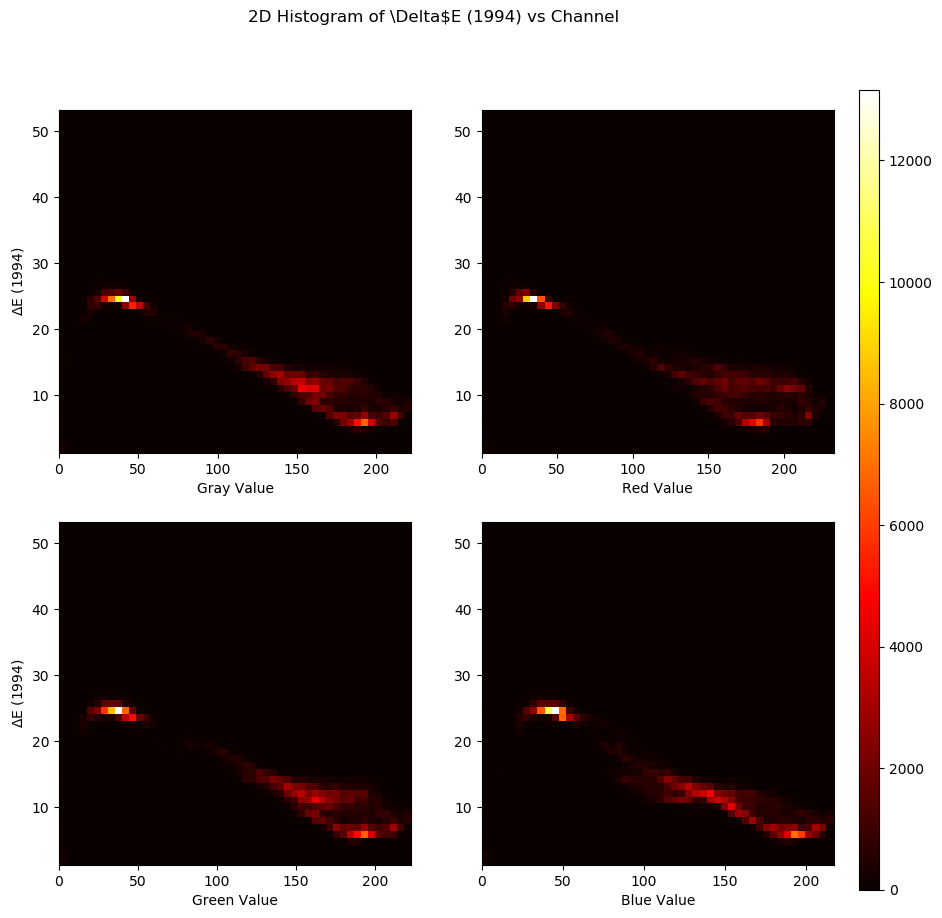

In [78]:
fig = plt.figure(figsize = [10,10], dpi = 100, facecolor = 'w')
plt.suptitle("2D Histogram of \Delta$E (1994) vs Channel")

BINS = 50
for i in tqdm(range(32)):
    image = INPUT[i]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(221)
    H, XX, YY, im = plt.hist2d(gray.ravel(), (DE_76_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)
    plt.ylabel("$\Delta$E (1994)")
    plt.xlabel("Gray Value")
    plt.subplot(222)
    H, XX, YY, im = plt.hist2d(image[:,:,0].ravel(), (DE_76_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)    plt.ylabel("RMSE")
    plt.xlabel("Red Value")
    plt.subplot(223)
    H, XX, YY, im = plt.hist2d(image[:,:,1].ravel(), (DE_76_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)    plt.ylabel("RMSE")
    plt.ylabel("$\Delta$E (1994)")
    plt.xlabel("Green Value")
    plt.subplot(224)
    H, XX, YY, im = plt.hist2d(image[:,:,2].ravel(), (DE_76_overall[0][i]).ravel(), bins = BINS, cmap = 'hot')#, normed = True)    plt.ylabel("RMSE")
    plt.xlabel("Blue Value")
    
cax = fig.add_axes([0.925, 0.1, 0.02, 0.8])
fig.colorbar(im, cax = cax, orientation='vertical')
plt.savefig("C:/Users/renep/Google Drive/Research/RMs/RM7/2DHistogram_DE_76.png")
plt.show()

# DRAFT APPENDIX

In [32]:
# munsell_trained_models = ["munsell_X.model", "munsell_X_100.model",
#                          "munsell_X_1000.model", "munsell_X_5000.model","munsell_X_10000.model"]

# MEAN_dE_76_models = []
# STD_dE_76_models = []
# MEAN_dE_CH_models = []
# STD_dE_CH_models = []

# "overall results"
# _RGB_ = []
# _DE_76_ = []
# _DE_CH_ = []
# _HS_ = []


# for model in tqdm(munsell_trained_models, desc = "MODEL"):
#     print("Working on " + str(model))
#     Predicted_RGB, DELTA_E_76, DELTA_E_CH, HYPERSPECTRAL_PREDICTION = Render_exp_RGB_image(model)
    
#     print("Plotting the rendered RGB images")
#     plt.figure(figsize=[17.5,8], facecolor = 'w')
#     plt.rcParams['axes.titlesize'] = 10
#     plt.rcParams.update({'font.size': 10})                
#     for i in range(32):
#         plt.suptitle("Predicted RGB images using " + str(model))
#         plt.subplot(4,8,i+1)
#         plt.imshow(Predicted_RGB[i])
#         plt.title(str(i+1))
#         plt.xticks([])
#         plt.yticks([])
#     plt.savefig("RGB_"+str(munsell_trained_models.index(model)) + ".png",dpi = 100)
#     plt.show()
#     print("Rendered RGB images displayed")

#     print("Plotting the Color Differences")
    
#     plt.figure(figsize=[17.5,8], facecolor = 'w')
#     plt.rcParams['axes.titlesize'] = 10
#     plt.rcParams.update({'font.size': 10})
#     for i in range(32):
#         plt.suptitle("Color Difference CIEL*a*b DE (1976)"  + str(model))
#         plt.subplot(4,8,i+1)
#         plt.imshow(DELTA_E_76[i])
#         plt.title(str(i+1))
#         plt.xticks([])
#         plt.yticks([])
#         plt.colorbar()
#         plt.clim(0,100)
#     plt.savefig("dE_76" + str(munsell_trained_models.index(model)) + ".png", dpi = 100)
#     plt.show()
    
#     plt.figure(figsize=[17.5,8], facecolor = 'w')
#     plt.rcParams['axes.titlesize'] = 10
#     plt.rcParams.update({'font.size': 10})
#     for i in range(32):
#         plt.suptitle("Color Difference CIEL*a*b DE (HUE & CHROMA)"   + str(model))
#         plt.subplot(4,8,i+1)
#         plt.imshow(DELTA_E_CH[i])
#         plt.title(str(i))
#         plt.xticks([])
#         plt.yticks([])
#         plt.colorbar()
#         plt.clim(0,100)
#     plt.savefig("dE_CH" + str(munsell_trained_models.index(model)) + ".png", dpi = 100)
#     plt.show()
    
#     print("Color Difference displayed")
    
#     _RGB_.append(Predicted_RGB)
#     _DE_76_.append(DELTA_E_76)
#     _DE_CH_.append(DELTA_E_CH)
#     _HS_.append(HYPERSPECTRAL_PREDICTION)
    
#     MEAN_dE_76 = []
#     STD_dE_76 = []
#     MEAN_dE_CH = []
#     STD_dE_CH = []
    
#     print("Calculating the Mean Difference")
#     for i in range(32):
        
#         MEAN_dE_76.append(np.mean(DELTA_E_76[i]))
#         STD_dE_76.append(np.std(DELTA_E_76[i]))
        
#         MEAN_dE_CH.append(np.mean(DELTA_E_CH[i]))
#         STD_dE_CH.append(np.std(DELTA_E_CH[i]))
        
#     print("Mean Difference calculated")
    
#     " !!! REVIEW THIS SECTION, AVERAGE STD SHOULD BE MEAN STD, NOT STD STD !!! "
    
#     MEAN_dE_76_models.append(np.mean(MEAN_dE_76))
#     STD_dE_76_models.append(np.std(MEAN_dE_76))
#     #STD_dE_76_models.append(np.std(STD_dE_76))
#     MEAN_dE_CH_models.append(np.mean(MEAN_dE_CH))
#     STD_dE_CH_models.append(np.std(MEAN_dE_CH))
#     #STD_dE_CH_models.append(np.std(STD_dE_CH))
    
#     print("Displaying the dataset's Mean Difference")
    
#     plt.figure(figsize=[20,5], facecolor = "w")
#     plt.errorbar(np.arange(32)+1, MEAN_dE_76, xerr = None, yerr = STD_dE_76)
#     plt.plot(np.arange(32)+1, MEAN_dE_76, 'ro', ms = 10 )
#     plt.xticks(np.arange(32)+1)
#     plt.grid()
#     plt.ylim(0,40)
#     plt.xlabel("Image Number")
#     plt.ylabel("delta E (1976)")
#     plt.axhline(2.5, color = 'g')
#     plt.title("dE_76" + str(model))
#     plt.legend(["Mean dE (1976)","Just Noticeable Difference"])
#     plt.savefig("dE (1976)_" + str(munsell_trained_models.index(model)) + ".png" , dpi = 100)
#     plt.show()
    
#     plt.figure(figsize=[20,5], facecolor = "w")
#     plt.errorbar(np.arange(32)+1, MEAN_dE_CH, xerr = None, yerr = STD_dE_CH)
#     plt.plot(np.arange(32)+1, MEAN_dE_CH, 'ro', ms = 10 )
#     plt.xticks(np.arange(32)+1)
#     plt.grid()
#     plt.ylim(0,40)
#     plt.xlabel("Image Number")
#     plt.ylabel("delta E (1994)")
#     plt.axhline(2.5, color = 'g')
#     plt.title("dE_CH" + str(model))
#     plt.legend(["Mean dE (HUE & CHROMA)","Just Noticeable Difference"])
#     plt.savefig("dE (HUE & CHROMA)_" + str(munsell_trained_models.index(model)) + ".png" , dpi = 100)
#     plt.show()
    
#     print("Finished working on "+ str(model))


MODEL:   0%|                                                                                     | 0/5 [00:00<?, ?it/s]

Working on munsell_X.model


NameError: name 'Render_exp_RGB_image' is not defined

In [1]:
_DE_76_[0]

NameError: name '_DE_76_' is not defined

MODEL:   0%|                                                                                     | 0/5 [00:00<?, ?it/s]

Working on munsell_X.model
Prediction using the model



Rendering RGB image: 100%|█████████████████████████████████████████████████████████████| 32/32 [06:34<00:00, 12.08s/it]

Plotting the rendered RGB images


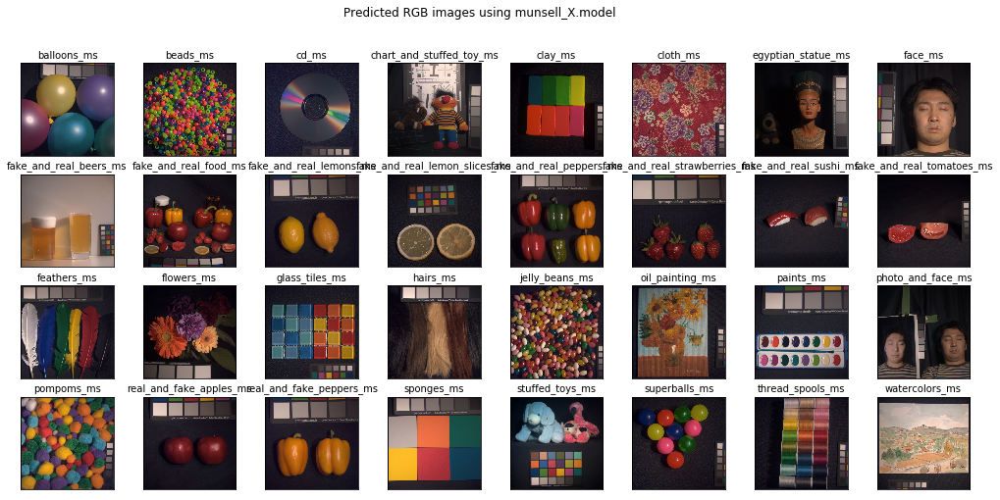

Rendered RGB images displayed



Calculating the Color Difference: 100%|█████████████████████████████████████████████| 32/32 [32:44<00:00, 61.38s/it]

Plotting the Color Differences


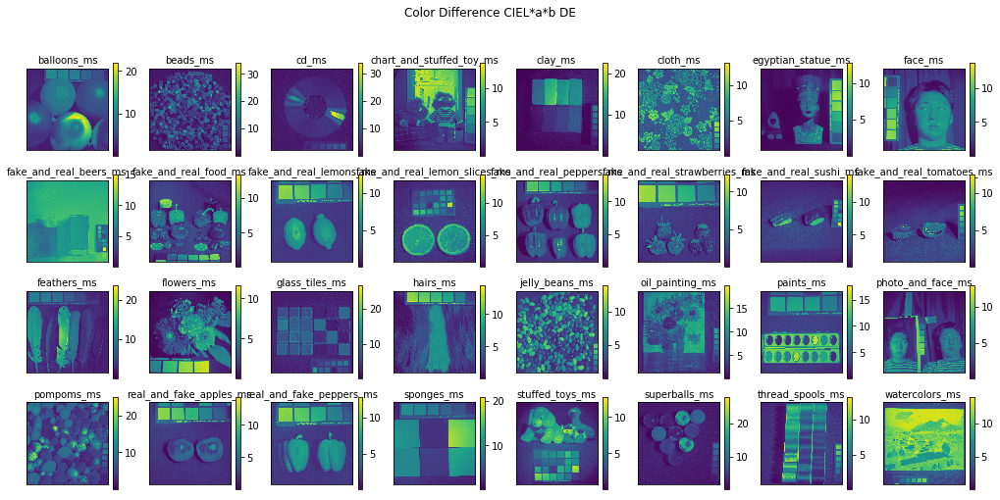

Color Difference displayed
Calculating the Mean Difference
Mean Difference calculated
Displaying the dataset's Mean Difference


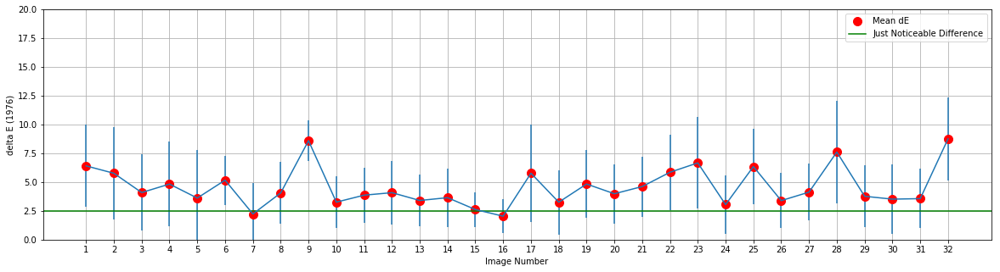

Finished working on munsell_X.model


MODEL:  20%|██████████████▌                                                          | 1/5 [39:24<2:37:39, 2364.91s/it]

Working on munsell_X_100.model
Prediction using the model



Rendering RGB image: 100%|██████████████████████████████████████████████████████████| 32/32 [06:20<00:00, 12.00s/it]

Plotting the rendered RGB images


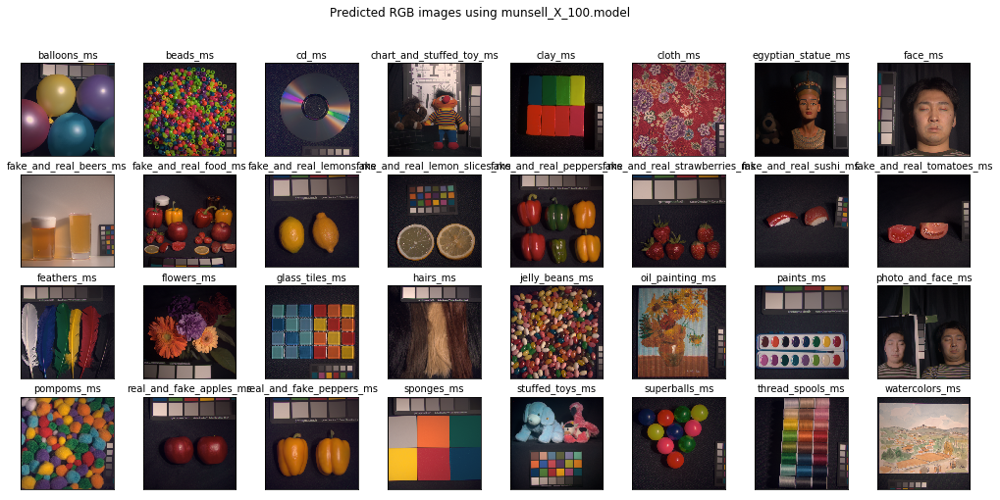

Rendered RGB images displayed



Calculating the Color Difference: 100%|█████████████████████████████████████████████| 32/32 [33:08<00:00, 65.13s/it]

Plotting the Color Differences


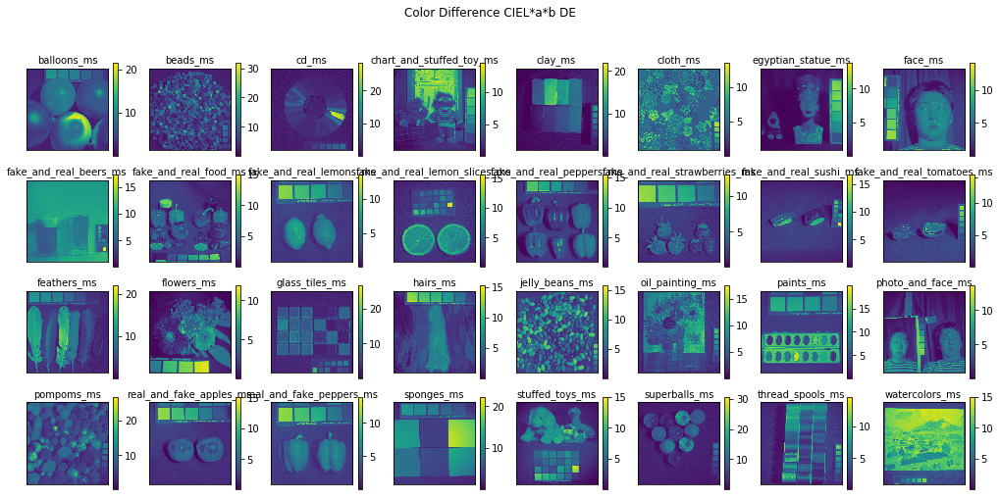

Color Difference displayed
Calculating the Mean Difference
Mean Difference calculated
Displaying the dataset's Mean Difference


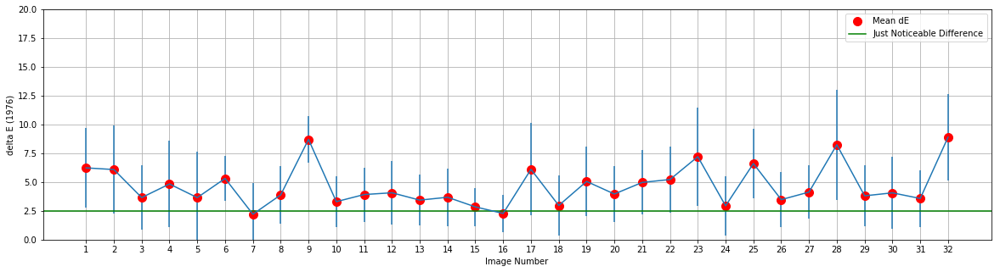

Finished working on munsell_X_100.model


MODEL:  40%|████████████████████████████▍                                          | 2/5 [1:19:02<1:58:26, 2368.80s/it]

Working on munsell_X_1000.model
Prediction using the model



Rendering RGB image: 100%|██████████████████████████████████████████████████████████| 32/32 [06:56<00:00, 12.04s/it]

Plotting the rendered RGB images


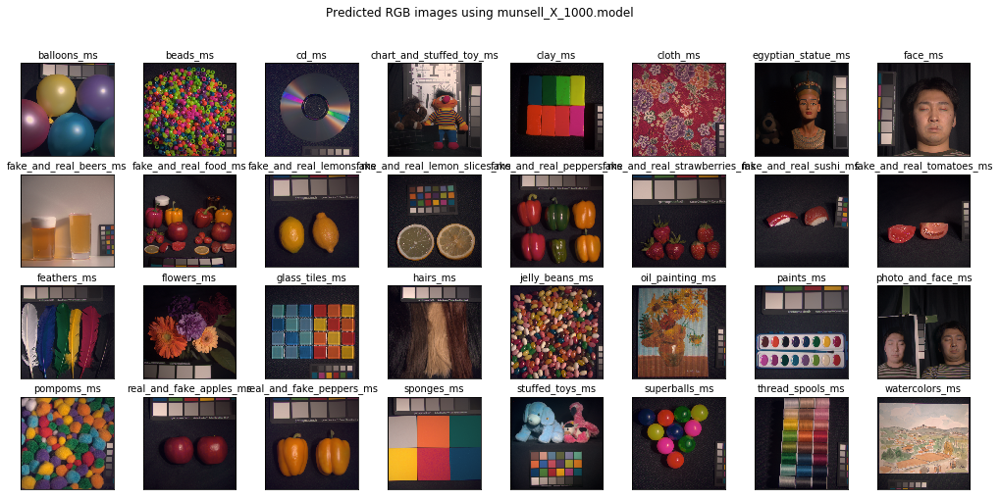

Rendered RGB images displayed



Calculating the Color Difference: 100%|█████████████████████████████████████████████| 32/32 [32:29<00:00, 60.73s/it]

Plotting the Color Differences


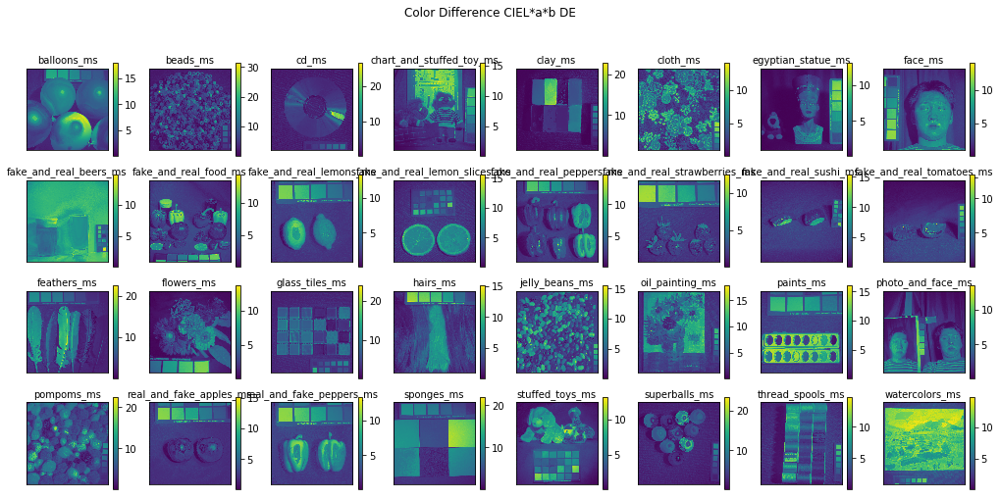

Color Difference displayed
Calculating the Mean Difference
Mean Difference calculated
Displaying the dataset's Mean Difference


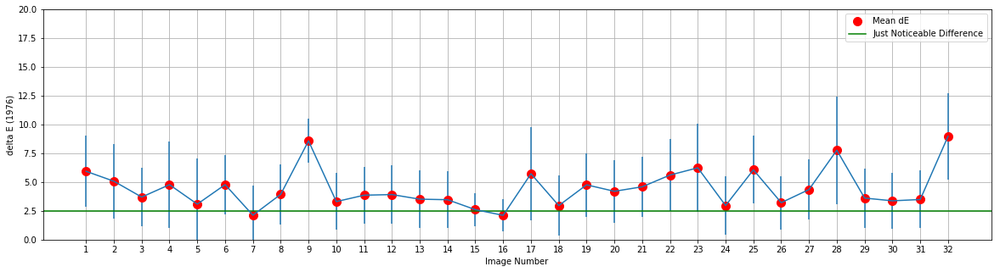

Finished working on munsell_X_1000.model


MODEL:  60%|██████████████████████████████████████████▌                            | 3/5 [1:59:35<1:19:35, 2387.88s/it]

Working on munsell_X_5000.model
Prediction using the model



Rendering RGB image: 100%|██████████████████████████████████████████████████████████| 32/32 [06:20<00:00, 11.90s/it]

Plotting the rendered RGB images


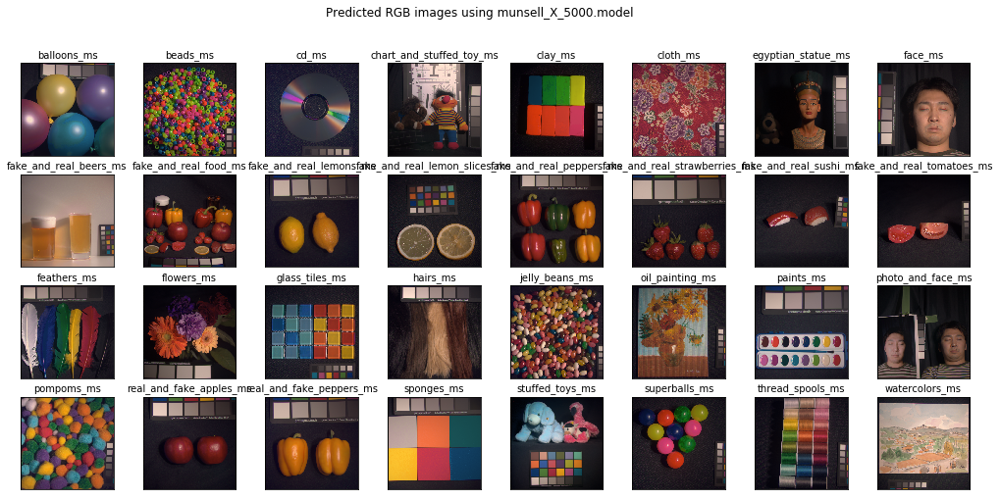

Rendered RGB images displayed



Calculating the Color Difference: 100%|█████████████████████████████████████████████| 32/32 [32:30<00:00, 60.77s/it]

Plotting the Color Differences


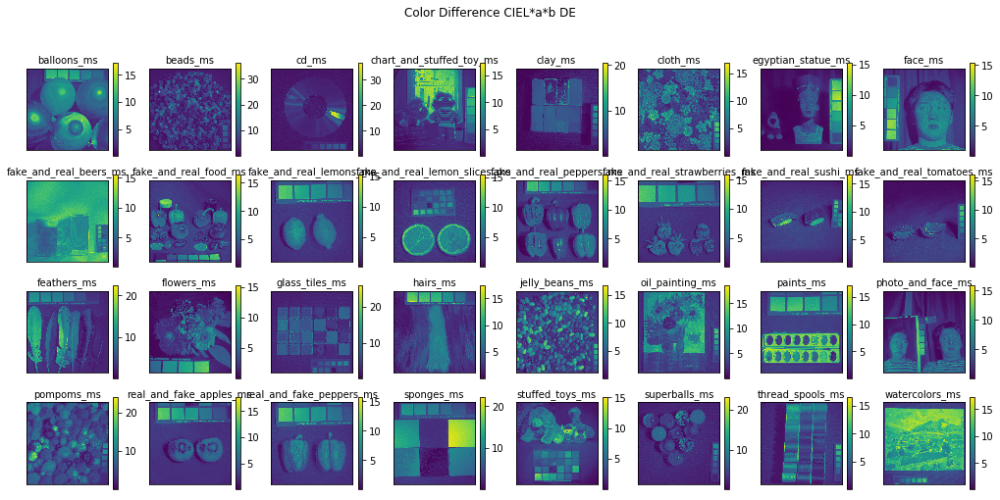

Color Difference displayed
Calculating the Mean Difference
Mean Difference calculated
Displaying the dataset's Mean Difference


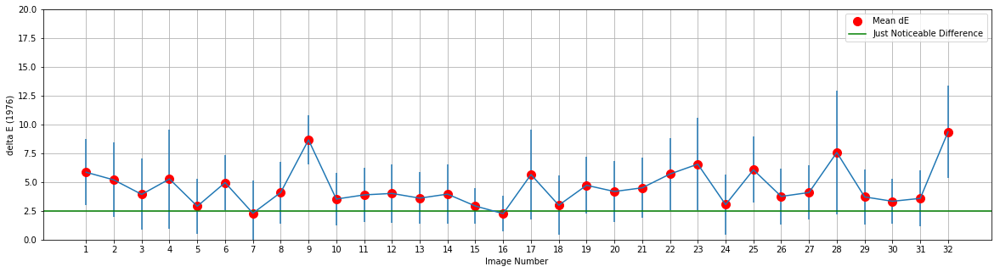

Finished working on munsell_X_5000.model


MODEL:  80%|██████████████████████████████████████████████████████████▍              | 4/5 [2:38:31<39:32, 2372.49s/it]

Working on munsell_X_10000.model
Prediction using the model



Rendering RGB image: 100%|██████████████████████████████████████████████████████████| 32/32 [06:18<00:00, 11.77s/it]

Plotting the rendered RGB images


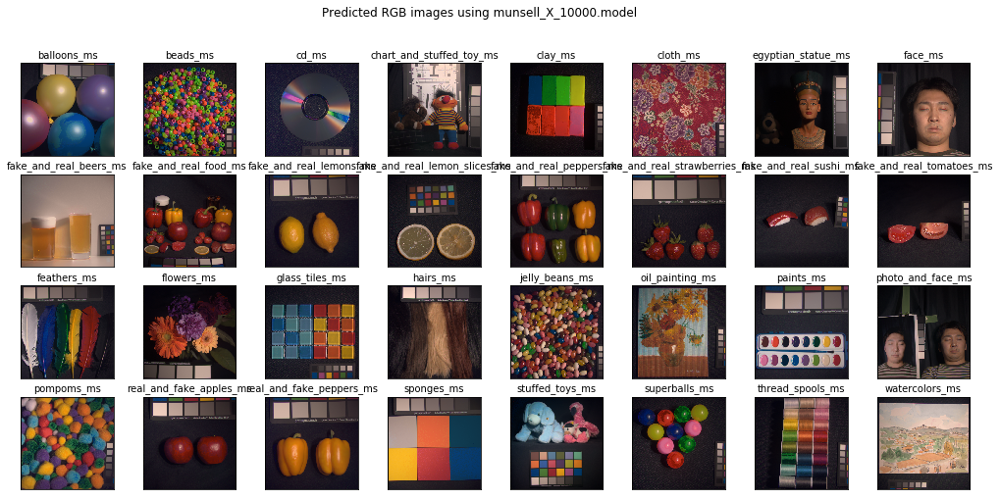

Rendered RGB images displayed



Calculating the Color Difference: 100%|█████████████████████████████████████████████| 32/32 [32:30<00:00, 60.68s/it]

Plotting the Color Differences


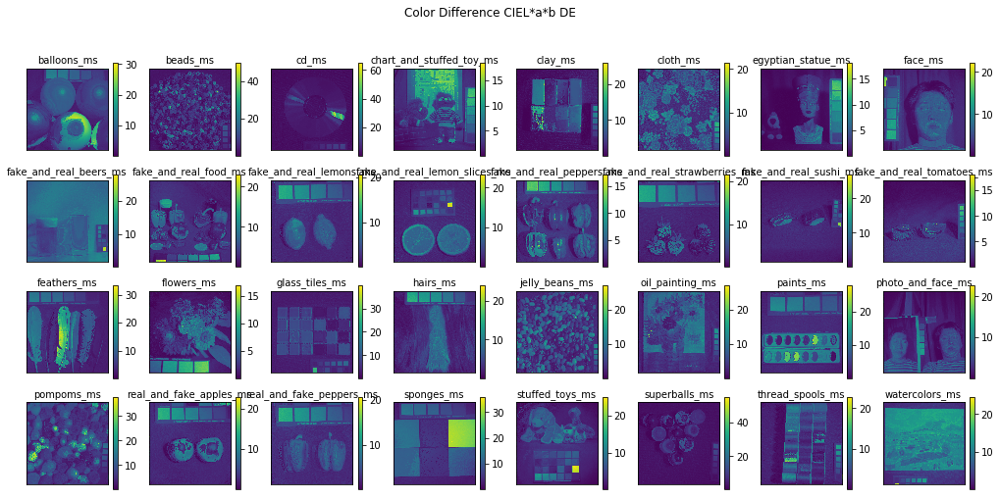

Color Difference displayed
Calculating the Mean Difference
Mean Difference calculated
Displaying the dataset's Mean Difference


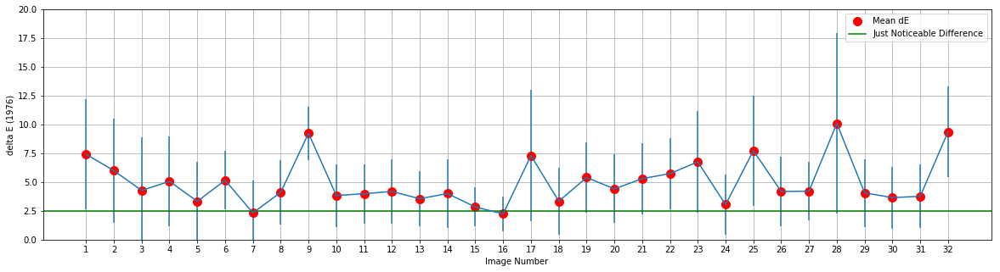

Finished working on munsell_X_10000.model


MODEL: 100%|█████████████████████████████████████████████████████████████████████████| 5/5 [3:17:26<00:00, 2361.28s/it]


In [7]:
# munsell_trained_models = ["munsell_X.model", "munsell_X_100.model",
#                          "munsell_X_1000.model", "munsell_X_5000.model","munsell_X_10000.model"]

# MEAN_dE_76_models = []
# STD_dE_76_models = []
# MEAN_dE_CH_models = []
# STD_dE_CH_models = []

# "overall results"
# _RGB_ = []
# _DE_76_ = []
# _DE_CH_ = []
# _HS_ = []


# for model in tqdm(munsell_trained_models, desc = "MODEL"):
#     print("Working on " + str(model))
#     Predicted_RGB, DELTA_E_76, DELTA_E_CH, HYPERSPECTRAL_PREDICTION = Render_exp_RGB_image(model)
#     _RGB_.append(Predicted_RGB)
#     _DE_76_.append(DELTA_E_76)
#     _DE_CH_.append(DELTA_E_CH)
#     _HS_.append(HYPERSPECTRAL_PREDICTION)
    
    
#     MEAN_dE_76 = []
#     STD_dE_76 = []
#     MEAN_dE_CH = []
#     STD_dE_CH = []
#     print("Calculating the Mean Difference")
#     for i in range(32):
        
#         MEAN_dE_76.append(np.mean(DELTA_E_76[i]))
#         STD_dE_76.append(np.std(DELTA_E_76[i]))
        
#         MEAN_dE_CH.append(np.mean(DELTA_E_CH[i]))
#         STD_dE_CH.append(np.std(DELTA_E_CH[i]))
#     print("Mean Difference calculated")
    
#     MEAN_dE_76_models.append(np.mean(MEAN_dE_76))
#     STD_dE_76_models.append(np.std(STD_dE_76))
#     MEAN_dE_CH_models.append(np.mean(MEAN_dE_CH))
#     STD_dE_CH_models.append(np.std(STD_dE_CH))
    
#     print("Displaying the dataset's Mean Difference")
    
#     plt.figure(figsize=[20,5], facecolor = "w")
#     plt.errorbar(np.arange(32)+1, MEAN_dE_76, xerr = None, yerr = STD_dE_76)
#     plt.plot(np.arange(32)+1, MEAN_dE_76, 'ro', ms = 10 )
#     plt.xticks(np.arange(32)+1)
#     plt.grid()
#     plt.ylim(0,40)
#     plt.xlabel("Image Number")
#     plt.ylabel("delta E (1976)")
#     plt.axhline(2.5, color = 'g')
#     plt.title("dE_76" + str(model))
#     plt.legend(["Mean dE (1976)","Just Noticeable Difference"])
#     plt.savefig("dE (1976)_" + str(munsell_trained_models.index(model)) + ".png" , dpi = 100)
#     plt.show()
    
#     plt.figure(figsize=[20,5], facecolor = "w")
#     plt.errorbar(np.arange(32)+1, MEAN_dE_CH, xerr = None, yerr = STD_dE_CH)
#     plt.plot(np.arange(32)+1, MEAN_dE_CH, 'ro', ms = 10 )
#     plt.xticks(np.arange(32)+1)
#     plt.grid()
#     plt.ylim(0,40)
#     plt.xlabel("Image Number")
#     plt.ylabel("delta E (1976)")
#     plt.axhline(2.5, color = 'g')
#     plt.title("dE_CH" + str(model))
#     plt.legend(["Mean dE (HUE & CHROMA)","Just Noticeable Difference"])
#     plt.savefig("dE (HUE & CHROMA)_" + str(munsell_trained_models.index(model)) + ".png" , dpi = 100)
#     plt.show()
#     print("Finished working on "+ str(model))


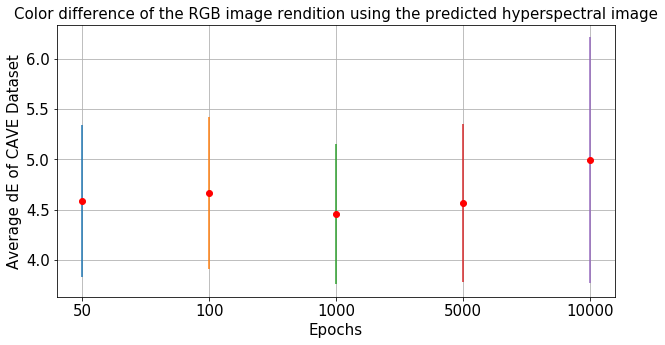

In [15]:
plt.figure(figsize=[10,5], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 15})    

for i in range(5):
    plt.plot(i,MEAN_dE_76_models[i], 'ro', ms = 10)
    plt.errorbar(i,MEAN_dE_76_models[i], xerr=None, yerr = STD_dE_76_models[i])
    plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
    plt.grid()
    plt.xlabel("Epochs")
    plt.ylabel("Average dE (1976) of CAVE Dataset")
    plt.title("Color difference (1976) of the RGB image rendition using the predicted hyperspectral image")
plt.show()


for i in range(5):
    plt.plot(i,MEAN_dE_CH_models[i], 'ro',  ms = 10)
    plt.errorbar(i,MEAN_dE_CH_models[i], xerr=None, yerr = STD_dE_CH_models[i])
    plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
    plt.grid()
    plt.xlabel("Epochs")
    plt.ylabel("Average dE (HUE & CHROMA) of CAVE Dataset")
    plt.title("Color difference (HUE & CHROMA) of the RGB image rendition using the predicted hyperspectral image")
plt.show()


In [14]:
i = 1
arr = np.asarray(INPUT[i])
hs_image_cube = np.zeros(shape=(512, 512, 31))
for j in tqdm(range(512)):
    rgb = arr[:,j]
    predictions = RGB2REF.predict(rgb)
    hs_image_cube[:,j,:] = predictions
    
predict_rgb = np.zeros(shape=np.shape(INPUT[i]))
dE = np.zeros(shape=[512,512])
INPUT_norm[i] = INPUT_norm[i]/np.amax(INPUT_norm[i])

print("Rendering the RGB image")
#print("Calculating the Color Difference (dE)")

for x in range(512):
    for y in range(512):

        spectrum = hs_image_cube[x,y]

        R = np.trapz(spectrum*r*D65)
        G = np.trapz(spectrum*g*D65)
        B = np.trapz(spectrum*b*D65)

        predict_rgb[x,y,:] = R,G,B
predict_rgb = predict_rgb/np.amax(predict_rgb)

Predicted_RGB.append(predict_rgb)
plt.figure(figsize=[17.5,8], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 10
plt.rcParams.update({'font.size': 10})                
plt.suptitle("Predicted RGB images using " + str(model))
plt.subplot(4,8,i+1)
plt.imshow(predict_rgb)
plt.title(name[i])
plt.xticks([])
plt.yticks([])
plt.savefig("RGB ("+str(model)+")", dpi = 100, format = 'png')
plt.show()


  0%|                                                                                          | 0/512 [00:00<?, ?it/s]


NameError: name 'RGB2REF' is not defined

In [37]:
model = "munsell_X_100.model"
RGB2REF = tf.keras.models.load_model(model)
Predicted_RGB = []
DELTA_E_76 = []
DELTA_E_CH = []

print("Prediction using the model")
for i in tqdm(range(1), desc = "Major Loop"):

    arr = np.asarray(INPUT[i])
    hs_image_cube = np.zeros(shape=(512, 512, 31))
    for j in range(512):
        rgb = arr[:,j]
        predictions = RGB2REF.predict(rgb)
        hs_image_cube[:,j,:] = predictions

    predict_rgb = np.zeros(shape=np.shape(INPUT[i]))
    dE_76 = np.zeros(shape=[512,512])
    dE_CH = np.zeros(shape=[512,512])

    INPUT_norm[i] = INPUT_norm[i]/np.amax(INPUT_norm[i])

    print("Rendering the RGB image")

    for x in tqdm(range(512), desc = 'x'):
        for y in tqdm(range(512), desc = 'y'):

            spectrum = hs_image_cube[x,y]

            R = np.trapz(spectrum*r*D65)
            G = np.trapz(spectrum*g*D65)
            B = np.trapz(spectrum*b*D65)
            
            dE_76[x,y] = del_E_76(CIELab(OUTPUT[i,x,y]),CIELab(spectrum))
            dE_CH[x,y] = del_E_CH(CIELab(OUTPUT[i,x,y]),CIELab(spectrum))

            predict_rgb[x,y,:] = R,G,B
    predict_rgb = predict_rgb/np.amax(predict_rgb)
    Predicted_RGB.append(predict_rgb)
    DELTA_E_76.append(dE_76)
    DELTA_E_CH.append(dE_CH)


Prediction using the model





Major Loop:   0%|                                                                                | 0/1 [00:00<?, ?it/s]

Rendering the RGB image






x:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in double_scalars





y:  91%|████████████████████████████████████████████████████████████████████▎      | 466/512 [00:00<00:00, 4382.13it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4393.28it/s]



x:   0%|▏                                                                              | 1/512 [00:00<01:06,  7.72it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  62%|██████████████████████████████████████████████▍                            | 317/512 [00:00<00:00, 3164.95it/s]






y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 3984.07it/s]



x:   6%|█████                                                                         | 33/512 [00:04<01:01,  7.79it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  82%|█████████████████████████████████████████████████████████████▊             | 422/512 [00:00<00:00, 4135.76it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4431.01it/s]



x:   7%|█████▏                                                                        | 34/512 [00:04<01:00,  7.96it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  79%|███████████████████████████████████████████████████████████                | 403/512 [00:00<00:00, 3902.36it/s]




y: 100%|██

y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4231.37it/s]



x:  13%|██████████                                                                    | 66/512 [00:08<00:56,  7.93it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  98%|█████████████████████████████████████████████████████████████████████████▍ | 501/512 [00:00<00:00, 4559.09it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4422.48it/s]



x:  13%|██████████▏                                                                   | 67/512 [00:08<00:55,  8.03it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  83%|██████████████████████████████████████████████████████████████             | 424/512 [00:00<00:00, 4209.34it/s]




y: 100%|██

y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4071.26it/s]



x:  19%|███████████████                                                               | 99/512 [00:13<00:58,  7.04it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  86%|████████████████████████████████████████████████████████████████▏          | 438/512 [00:00<00:00, 4348.25it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 3979.63it/s]



x:  20%|███████████████                                                              | 100/512 [00:13<00:57,  7.16it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  81%|████████████████████████████████████████████████████████████▋              | 414/512 [00:00<00:00, 4108.94it/s]




y: 100%|██

y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4110.59it/s]



x:  26%|███████████████████▊                                                         | 132/512 [00:17<00:51,  7.43it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  85%|███████████████████████████████████████████████████████████████▋           | 435/512 [00:00<00:00, 4317.28it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4242.71it/s]



x:  26%|████████████████████                                                         | 133/512 [00:17<00:50,  7.55it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  89%|██████████████████████████████████████████████████████████████████▊        | 456/512 [00:00<00:00, 4507.42it/s]




y: 100%|██

y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 3912.24it/s]



x:  32%|████████████████████████▊                                                    | 165/512 [00:21<00:45,  7.67it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  85%|███████████████████████████████████████████████████████████████▊           | 436/512 [00:00<00:00, 4326.93it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4207.67it/s]



x:  32%|████████████████████████▉                                                    | 166/512 [00:21<00:44,  7.74it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  97%|████████████████████████████████████████████████████████████████████████▉  | 498/512 [00:00<00:00, 4313.05it/s]




y: 100%|██

x:  39%|█████████████████████████████▊                                               | 198/512 [00:26<00:41,  7.64it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  90%|███████████████████████████████████████████████████████████████████▍       | 460/512 [00:00<00:00, 4566.70it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4464.06it/s]



x:  39%|█████████████████████████████▉                                               | 199/512 [00:26<00:39,  7.83it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  92%|████████████████████████████████████████████████████████████████████▋      | 469/512 [00:00<00:00, 4654.67it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4541.83it/s]



x:  39%|██

x:  45%|██████████████████████████████████▋                                          | 231/512 [00:30<00:36,  7.73it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  42%|███████████████████████████████▊                                           | 217/512 [00:00<00:00, 2154.25it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 2528.91it/s]



x:  45%|██████████████████████████████████▉                                          | 232/512 [00:30<00:42,  6.55it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  90%|███████████████████████████████████████████████████████████████████▋       | 462/512 [00:00<00:00, 4585.16it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4463.30it/s]



x:  46%|██

x:  52%|███████████████████████████████████████▋                                     | 264/512 [00:34<00:32,  7.71it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  86%|████████████████████████████████████████████████████████████████▋          | 442/512 [00:00<00:00, 4386.80it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4278.05it/s]



x:  52%|███████████████████████████████████████▊                                     | 265/512 [00:34<00:31,  7.77it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  84%|██████████████████████████████████████████████████████████████▉            | 430/512 [00:00<00:00, 4268.71it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4207.87it/s]



x:  52%|██

x:  58%|████████████████████████████████████████████▋                                | 297/512 [00:38<00:27,  7.85it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  80%|████████████████████████████████████████████████████████████▎              | 412/512 [00:00<00:00, 4090.29it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4073.52it/s]



x:  58%|████████████████████████████████████████████▊                                | 298/512 [00:38<00:27,  7.72it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  85%|███████████████████████████████████████████████████████████████▍           | 433/512 [00:00<00:00, 4297.44it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4242.68it/s]



x:  58%|██

x:  64%|█████████████████████████████████████████████████▋                           | 330/512 [00:42<00:22,  8.15it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  90%|███████████████████████████████████████████████████████████████████▌       | 461/512 [00:00<00:00, 4575.38it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4464.10it/s]



x:  65%|█████████████████████████████████████████████████▊                           | 331/512 [00:42<00:22,  8.19it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  87%|█████████████████████████████████████████████████████████████████          | 444/512 [00:00<00:00, 4406.57it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4313.29it/s]



x:  65%|██

x:  71%|██████████████████████████████████████████████████████▌                      | 363/512 [00:46<00:18,  8.04it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  83%|██████████████████████████████████████████████████████████████▌            | 427/512 [00:00<00:00, 4239.12it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4173.75it/s]



x:  71%|██████████████████████████████████████████████████████▋                      | 364/512 [00:47<00:18,  7.95it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  83%|█████████████████████████████████████████████████████████████▉             | 423/512 [00:00<00:00, 4198.13it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4139.94it/s]



x:  71%|██

x:  77%|███████████████████████████████████████████████████████████▌                 | 396/512 [00:50<00:14,  8.18it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  82%|█████████████████████████████████████████████████████████████▌             | 420/512 [00:00<00:00, 4169.28it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4042.85it/s]



x:  78%|███████████████████████████████████████████████████████████▋                 | 397/512 [00:51<00:14,  8.00it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  70%|████████████████████████████████████████████████████▏                      | 356/512 [00:00<00:00, 3534.20it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 3055.40it/s]



x:  78%|██

x:  84%|████████████████████████████████████████████████████████████████▌            | 429/512 [00:55<00:10,  7.87it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  87%|█████████████████████████████████████████████████████████████████          | 444/512 [00:00<00:00, 4406.67it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4314.06it/s]



x:  84%|████████████████████████████████████████████████████████████████▋            | 430/512 [00:55<00:10,  7.93it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  74%|███████████████████████████████████████████████████████▏                   | 377/512 [00:00<00:00, 3742.67it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 3640.89it/s]



x:  84%|██

x:  90%|█████████████████████████████████████████████████████████████████████▍       | 462/512 [00:59<00:06,  7.84it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  69%|███████████████████████████████████████████████████▍                       | 351/512 [00:00<00:00, 3484.57it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 3666.96it/s]



x:  90%|█████████████████████████████████████████████████████████████████████▋       | 463/512 [00:59<00:06,  7.52it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  88%|█████████████████████████████████████████████████████████████████▋         | 448/512 [00:00<00:00, 4446.61it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4314.06it/s]



x:  91%|██

x:  97%|██████████████████████████████████████████████████████████████████████████▍  | 495/512 [01:03<00:02,  8.06it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  85%|███████████████████████████████████████████████████████████████▌           | 434/512 [00:00<00:00, 4307.35it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4278.03it/s]



x:  97%|██████████████████████████████████████████████████████████████████████████▌  | 496/512 [01:03<00:01,  8.03it/s]




y:   0%|                                                                                       | 0/512 [00:00<?, ?it/s]




y:  88%|█████████████████████████████████████████████████████████████████▉         | 450/512 [00:00<00:00, 4466.27it/s]




y: 100%|███████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 4350.66it/s]



x:  97%|██

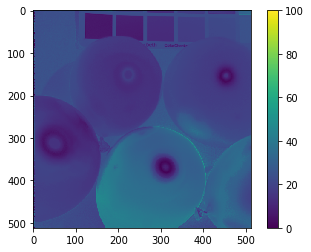

In [45]:
plt.imshow(dE_76)
plt.colorbar()
plt.clim(0,100)


In [50]:
np.std(dE_76)

8.802274045119507

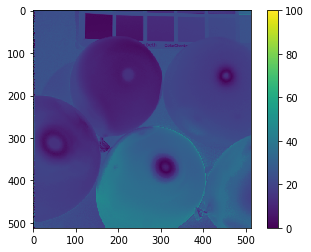

In [46]:
plt.imshow(dE_CH)
plt.clim(0,100)
plt.colorbar()

In [20]:
DELTA_E = []
for i in tqdm(range(1)):
    dE = np.zeros(shape=[512,512])
    INPUT_norm[i] = INPUT_norm[i]/np.amax(INPUT_norm[i])
    for x in range(512):
        for y in range(512):
            rgb1 = sRGBColor(INPUT_norm[i][x,y][0],INPUT_norm[i][x,y][1],INPUT_norm[i][x,y][2])
            rgb2 = sRGBColor(Predicted_RGB[i][x,y][0],Predicted_RGB[i][x,y][1],Predicted_RGB[i][x,y][2])
            color1_lab = convert_color(rgb1, LabColor)
            color2_lab = convert_color(rgb2, LabColor)
            delta_e = delta_e_cie2000(color1_lab, color2_lab)
            dE[x,y] = delta_e
    DELTA_E.append(dE)




  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:02<00:00, 62.04s/it]

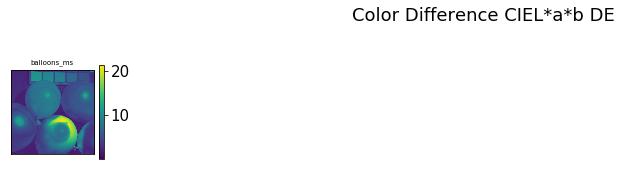

In [21]:
plt.figure(figsize=[17.5,8], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 7
plt.rcParams.update({'font.size': 15})

for i in range(1):
    plt.suptitle("Color Difference CIEL*a*b DE")
    plt.subplot(4,8,i+1)
    plt.imshow(DELTA_E[i])#, vmin = 0, vmax = 1)
    plt.title(name[i])
    plt.xticks([])
    plt.yticks([])
    plt.colorbar()
plt.show()


In [115]:
MEAN_dE = []
STD_dE = []
for i in range(32):
    MEAN_dE.append(np.mean(DELTA_E[i]))
    STD_dE.append(np.std(DELTA_E[i]))
    

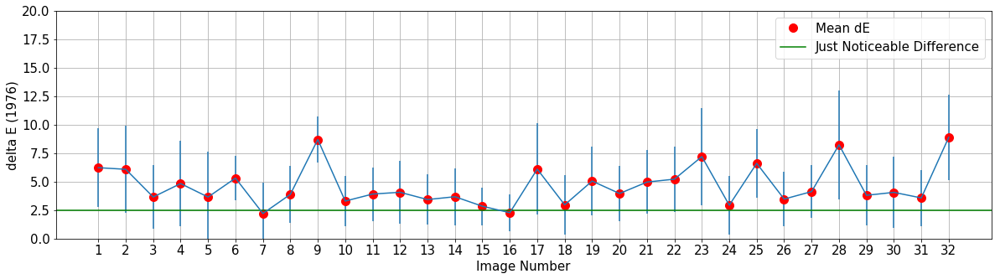

In [144]:
plt.figure(figsize=[20,5], facecolor = "w")
plt.errorbar(np.arange(32)+1, MEAN_dE, xerr = None, yerr = STD_dE)
plt.plot(np.arange(32)+1, MEAN_dE, 'ro', ms = 10 )

plt.xticks(np.arange(32)+1)
plt.grid()
plt.ylim(0,20)
plt.xlabel("Image Number")
plt.ylabel("delta E (1976)")
plt.axhline(2.5, color = 'g')
plt.legend(["Mean dE","Just Noticeable Difference"])


In [117]:
STD_dE

[3.4606484574419576,
 3.8345077606916234,
 2.8172399378671065,
 3.729293378763464,
 4.005314562508252,
 1.9332689008873225,
 2.6906959286125125,
 2.5348140714991856,
 1.9892376483318739,
 2.176338089580021,
 2.3535391290226984,
 2.7360671189029464,
 2.204970077882073,
 2.5115971315231786,
 1.6516221037926593,
 1.617778345675242,
 4.001528571521123,
 2.6417812859671743,
 3.0375186194523356,
 2.4597986157519207,
 2.7909713637563653,
 2.8837846327006593,
 4.288868622377915,
 2.563444271423508,
 2.9927008160712303,
 2.391321465134441,
 2.3375291555779794,
 4.776586775592789,
 2.665225221170022,
 3.154751058454395,
 2.4591899948583387,
 3.7800247563834897]

In [31]:
from tqdm import tqdm_notebook as tqdm
import time

for i in tqdm(range(0,10)):
    time.sleep(1)


In [24]:
my_list = list(range(10000))
for x in tqdm(my_list):
    pass
my_list = list(range(10000))
with tqdm(total=len(my_list)) as pbar:
    for x in my_list:
        pbar.update(1)

In [25]:
for i in range(0,10000):
     compute(i)
     print(i)

NameError: name 'compute' is not defined

In [ ]:
# def Render_exp_RGB_image(model):
#     RGB2REF = tf.keras.models.load_model(model)
#     Predicted_RGB = []
#     print("Prediction using the model")
#     for i in tqdm(range(32), desc = "Major Loop"):

#         arr = np.asarray(INPUT[i])
#         hs_image_cube = np.zeros(shape=(512, 512, 31))
#         for j in range(512):
#             rgb = arr[:,j]
#             predictions = RGB2REF.predict(rgb)
#             hs_image_cube[:,j,:] = predictions
    
#         predict_rgb = np.zeros(shape=np.shape(INPUT[i]))
#         dE = np.zeros(shape=[512,512])
#         INPUT_norm[i] = INPUT_norm[i]/np.amax(INPUT_norm[i])
        
#         for x in range(512):
#             for y in range(512):

#                 spectrum = hs_image_cube[x,y]

#                 R = np.trapz(spectrum*r*D65)
#                 G = np.trapz(spectrum*g*D65)
#                 B = np.trapz(spectrum*b*D65)

#                 predict_rgb[x,y,:] = R,G,B
        
#         predict_rgb = predict_rgb/np.amax(predict_rgb)
#         Predicted_RGB.append(predict_rgb) 
        
#         print("RGB image (" + str(i+1) + ") rendered" )
#     DELTA_E = []  
#     for i in range(32):
#         for x in range(512):
#             for y in range(512):
#                 rgb1 = sRGBColor(INPUT_norm[i][x,y][0],INPUT_norm[i][x,y][1],INPUT_norm[i][x,y][2])
#                 rgb2 = sRGBColor(R,G,B)
#                 color1_lab = convert_color(rgb1, LabColor)
#                 color2_lab = convert_color(rgb2, LabColor)
#                 delta_e = delta_e_cie2000(color1_lab, color2_lab)
#                 dE[x,y] = delta_e
                
#         DELTA_E.append(dE)
#         print("Color difference (" + str(i+1) + ") calculated")

#     print("Plotting the rendered RGB images")
#     plt.figure(figsize=[17.5,8], facecolor = 'w')
#     plt.rcParams['axes.titlesize'] = 10
#     plt.rcParams.update({'font.size': 10})                
#     for i in range(32):
#         plt.suptitle("Predicted RGB images using " + str(model))
#         plt.subplot(4,8,i+1)
#         plt.imshow(Predicted_RGB[i])
#         plt.title(name[i])
#         plt.xticks([])
#         plt.yticks([])
#     plt.savefig("RGB_"+str(munsell_trained_models.index(model)) + ".png",dpi = 100)
#     plt.show()
    
#     print("Rendered RGB images displayed")
#     print("Plotting the Color Differences")
#     plt.figure(figsize=[17.5,8], facecolor = 'w')
#     plt.rcParams['axes.titlesize'] = 10
#     plt.rcParams.update({'font.size': 10})
#     for i in range(32):
#         plt.suptitle("Color Difference CIEL*a*b DE")
#         plt.subplot(4,8,i+1)
#         plt.imshow(DELTA_E[i]
#         plt.title(name[i])
#         plt.xticks([])
#         plt.yticks([])
#         plt.colorbar()
      
#     plt.savefig("dE" + str(munsell_trained_models.index(model)) + ".png", dpi = 100)
#     plt.show()
#     print("Color Difference displayed")

#     return Predicted_RGB, DELTA_E


In [ ]:
# munsell_trained_models = ["munsell_X.model", "munsell_X_100.model",
#                          "munsell_X_1000.model", "munsell_X_5000.model","munsell_X_10000.model"]

# MEAN_dE_models = []
# STD_dE_models = []

# for model in tqdm(munsell_trained_models, desc = str(model)):
#     print("Working on " + str(model))
#     Predicted_RGB, DELTA_E = Render_exp_RGB_image(model)
#     MEAN_dE = []
#     STD_dE = []
#     print("Calculating the Mean Difference")
#     for i in range(32):
#         MEAN_dE.append(np.mean(DELTA_E[i]))
#         STD_dE.append(np.std(DELTA_E[i]))
#     print("Mean Difference calculated")
#     MEAN_dE_models.append(np.mean(MEAN_dE))
#     STD_dE_models.append(np.std(STD_dE))
    
#     print("Displaying the dataset's Mean Difference")
#     plt.figure(figsize=[20,5], facecolor = "w")
#     plt.errorbar(np.arange(32)+1, MEAN_dE, xerr = None, yerr = STD_dE)
#     plt.plot(np.arange(32)+1, MEAN_dE, 'ro', ms = 10 )
#     plt.xticks(np.arange(32)+1)
#     plt.grid()
#     plt.ylim(0,20)
#     plt.xlabel("Image Number")
#     plt.ylabel("delta E (1976)")
#     plt.axhline(2.5, color = 'g')
#     plt.legend(["Mean dE","Just Noticeable Difference"])
#     plt.savefig("dE (1976)_" + str(munsell_trained_models.index(model)) + ".png" , dpi = 100)
#     plt.show()
#     print("Finished working on "+ str(model))


In [ ]:
# for i in range(5):
#     plt.plot(i,MEAN_dE_models[i], 'ro')
#     plt.errorbar(i,MEAN_dE_models[i], xerr=None, yerr = STD_dE_models[i][i])
#     plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
#     plt.grid()
#     plt.ylim(0,0.1)
#     plt.xlabel("Epochs")
#     plt.ylabel("Average dE of CAVE Dataset")
#     plt.title("Color difference of the RGB image rendition using the predicted hyperspectral image")
# plt.show()
